# Further Ideas: GAN that generates images similar to flower dataset

...

| Teammember |                    |
|------------|--------------------|
| 1.         | Nadine Weber       |
| 2.         | Patrick Singer     |


In [1]:
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import random
from datetime import datetime
import os
import time
from PIL import Image

%matplotlib inline

print(f"Tensorflow version: {tf.__version__} | Keras version: {keras.__version__}")
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

2023-04-11 01:37:24.259409: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


Tensorflow version: 2.4.1 | Keras version: 2.4.0
Num GPUs Available:  1


2023-04-11 01:37:26.372238: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2023-04-11 01:37:26.373404: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2023-04-11 01:37:26.396499: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:05:00.0 name: NVIDIA TITAN Xp computeCapability: 6.1
coreClock: 1.582GHz coreCount: 30 deviceMemorySize: 11.91GiB deviceMemoryBandwidth: 510.07GiB/s
2023-04-11 01:37:26.396526: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
2023-04-11 01:37:26.398651: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.10
2023-04-11 01:37:26.398685: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublasLt.so.10
2023-

Original dataset: max val = 255 | min val = 0
Normalized dataset: max val = 1.0 | min val = 0.0


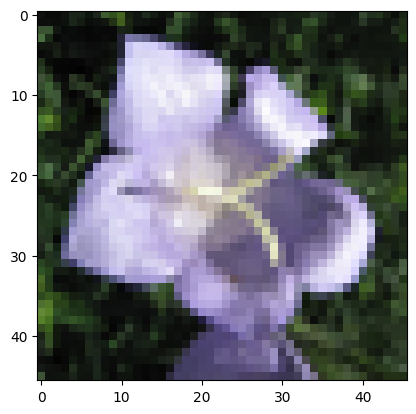

In [2]:
# Load Flower Dataset
img_dir = "./datasets/flowers_expanded"
train_x = np.empty((len(os.listdir(img_dir)), 46, 46, 3), dtype=np.uint8)

for i, img_file in enumerate(os.listdir(img_dir)):
    img_path = os.path.join(img_dir, img_file)
    img = Image.open(img_path).convert("RGB").resize((46, 46))
    train_x[i] = np.array(img)

plt.imshow(train_x[0])
    
# Normalize dataset
train_x_norm = train_x/255
print(f"Original dataset: max val = {np.max(train_x)} | min val = {np.min(train_x)}")
print(f"Normalized dataset: max val = {np.max(train_x_norm)} | min val = {np.min(train_x_norm)}")

# Show one example image
plt.imshow(train_x[random.randint(0,len(train_x))]);

In [3]:
# Reshaping dataset (Conv2D wants input = (batch_size, height, width, channels))
x_train_reshaped = tf.convert_to_tensor(train_x_norm)
print(f"Dataset shape: {x_train_reshaped.shape}")

Dataset shape: (1358, 46, 46, 3)


2023-04-11 01:37:28.435971: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-11 01:37:28.436174: I tensorflow/compiler/jit/xla_gpu_device.cc:99] Not creating XLA devices, tf_xla_enable_xla_devices not set
2023-04-11 01:37:28.437138: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:05:00.0 name: NVIDIA TITAN Xp computeCapability: 6.1
coreClock: 1.582GHz coreCount: 30 deviceMemorySize: 11.91GiB deviceMemoryBandwidth: 510.07GiB/s
2023-04-11 01:37:28.437165: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
2023-04-11 01:37:28.437185: I tensorflow/stream_executor/platform/default/ds

In [4]:
def build_discriminator():
    model = keras.Sequential([
        keras.layers.Conv2D(input_shape=(46, 46, 3), filters=32, kernel_size=5, padding="same", activation=keras.layers.LeakyReLU(alpha=0.01)),
        keras.layers.AveragePooling2D(pool_size=(2, 2), strides=(2, 2)),
        keras.layers.Conv2D(filters=64, kernel_size=5, padding="same", activation=keras.layers.LeakyReLU(alpha=0.01)),
        keras.layers.AveragePooling2D(pool_size=(2, 2), strides=(2, 2)),
        keras.layers.Flatten(),
        keras.layers.Dense(units=1024, activation=keras.layers.LeakyReLU(alpha=0.01)),
        keras.layers.Dense(units=1, activation="linear")
    ])
    
    return model

In [5]:
test_discriminator_model = build_discriminator()
test_discriminator_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 46, 46, 32)        2432      
_________________________________________________________________
average_pooling2d (AveragePo (None, 23, 23, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 23, 23, 64)        51264     
_________________________________________________________________
average_pooling2d_1 (Average (None, 11, 11, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 7744)              0         
_________________________________________________________________
dense (Dense)                (None, 1024)              7930880   
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 1

**Testing model with sample image**

In [6]:
print(test_discriminator_model.predict(x_train_reshaped[0:1]))

2023-04-11 01:37:29.095042: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2023-04-11 01:37:29.095479: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 3198120000 Hz
2023-04-11 01:37:29.161863: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.10
2023-04-11 01:37:29.288075: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.7
2023-04-11 01:37:29.821929: W tensorflow/stream_executor/gpu/asm_compiler.cc:63] Running ptxas --version returned 256
2023-04-11 01:37:29.860414: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: ptxas exited with non-zero error code 256, output: 
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.


[[0.5136296]]


In [7]:
from tensorflow.keras.layers import Layer

class CustomUpsample(Layer):
    def __init__(self, size=(2, 2), **kwargs):
        super().__init__(**kwargs)
        self.size = size
    
    def call(self, inputs):
        return tf.image.resize(inputs, size=self.size, method=tf.image.ResizeMethod.BILINEAR)

In [8]:
def build_generator(n, output_dim=46):
    l = ((output_dim*2)**2)*3
    
    model = keras.Sequential([
        keras.layers.Dense(input_shape=(n,), units=l, activation="relu"),
        keras.layers.Reshape((output_dim*2, output_dim*2, 3), input_shape=(l,)),
        keras.layers.Conv2D(filters=int(n/2), kernel_size=3, strides=(2, 2), padding="same"),
        keras.layers.BatchNormalization(),
        keras.layers.ReLU(),
        CustomUpsample((output_dim*2+2, output_dim*2+2)),
        keras.layers.Conv2D(filters=int(n/4), kernel_size=3, strides=(2, 2)),
        keras.layers.BatchNormalization(),
        keras.layers.ReLU(),
        CustomUpsample((output_dim*2+2, output_dim*2+2)),
        keras.layers.Conv2D(filters=int(n/8), kernel_size=3, strides=(2, 2)),
        keras.layers.BatchNormalization(),
        keras.layers.ReLU(),
        CustomUpsample((output_dim*2+2, output_dim*2+2)),
        keras.layers.Conv2D(filters=3, kernel_size=3, strides=(2, 2), activation="sigmoid")      
    ])
    
    return model

In [9]:
test_generator_model = build_generator(100, output_dim=46)
test_generator_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 25392)             2564592   
_________________________________________________________________
reshape (Reshape)            (None, 92, 92, 3)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 46, 46, 50)        1400      
_________________________________________________________________
batch_normalization (BatchNo (None, 46, 46, 50)        200       
_________________________________________________________________
re_lu (ReLU)                 (None, 46, 46, 50)        0         
_________________________________________________________________
custom_upsample (CustomUpsam (None, 94, 94, 50)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 46, 46, 25)       

**Testing model with sample noise**

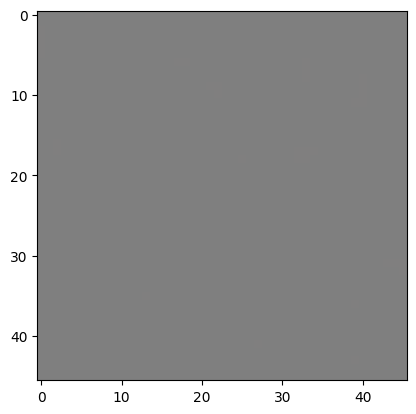

In [10]:
test_out = test_generator_model.predict(([random.random() for _ in range(100)],))
plt.imshow((test_out*255).astype('uint8').squeeze());

In [11]:
@tf.function
def calc_discriminator_loss(real_output, fake_output):
    return tf.reduce_mean(fake_output) - tf.reduce_mean(real_output)

@tf.function
def calc_generator_loss(fake_output):
    return -tf.reduce_mean(fake_output)

In [12]:
def create_log_folder():
    current_time = datetime.now().strftime("%Y%m%d-%H%M%S")
    log_dir = os.path.join("./tensorboard/flowers", current_time)

    if not os.path.exists(log_dir):
        os.makedirs(log_dir)

    file_writer = tf.summary.create_file_writer(log_dir)
    
    return file_writer, log_dir

In [13]:
# Show images of a batch
def show_imgs_of_batch(image_batch):
    fig = plt.figure()

    for i in range(len(image_batch)):
        fig.add_subplot(1, len(image_batch), i+1)
        plt.imshow(image_batch[i], cmap="gray")
        plt.axis('off')
    plt.show()

In [14]:
def pretrain_step(image_batch, generator_model, discriminator_model, discriminator_optimizer, noise_vector_length=100, show_details=False):
    image_batch = tf.convert_to_tensor(image_batch)   
    
    if show_details:
        show_imgs_of_batch(image_batch)
    
    # Generate fake images
    noise = tf.random.normal([len(image_batch), noise_vector_length])
    fake_img_batch = generator_model(noise, training=False)
    
    if show_details:
        show_imgs_of_batch(fake_img_batch)
    
    # Loss
    with tf.GradientTape(persistent=True) as tape:
        real_img_predictions = discriminator_model(image_batch, training=True)   
        fake_img_predictions = discriminator_model(fake_img_batch, training=True)
        
        if show_details:
            print(f"Real predictions:\n{real_img_predictions}\n"
                  f"Fake predictions:\n{fake_img_predictions}")
        
        loss = calc_discriminator_loss(real_img_predictions, fake_img_predictions)
        
        if show_details:
            print(f"Loss: {loss}")

    # Get gradients
    gradients = tape.gradient(loss, discriminator_model.trainable_variables)
    
    # Apply gradients to weights in model
    discriminator_optimizer.apply_gradients(zip(gradients, discriminator_model.trainable_variables))

    return {"loss": loss.numpy(), 
            "real_img_confidence": tf.reduce_mean(real_img_predictions).numpy(),
            "fake_img_confidence": tf.reduce_mean(fake_img_predictions).numpy()}

In [15]:
def pretraining(batch_size, steps, generator_model, discriminator_model, discriminator_optimizer, train_data=x_train_reshaped):
    step_results = []
    fig = plt.figure(dpi=80)
    batches = [train_data[x:x+batch_size] for x in range(0, len(train_data),batch_size)]
    if len(batches) > steps:
        batches = batches[:steps]
    
    for batch_imgs in batches:
        step_result = pretrain_step(batch_imgs, generator_model, discriminator_model, discriminator_optimizer, show_details=False)
        step_results.append(step_result)
    
    # Plot
    fig.add_subplot(2, 1, 1)
    
    plt.plot([val["loss"] for val in step_results], "b")
    plt.title("Discriminator Pretraining")
    plt.ylabel("Loss")
    plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    
    fig.add_subplot(2, 1, 2)
    plt.plot([val["real_img_confidence"] for val in step_results], "g", label="Real Images")
    plt.plot([val["fake_img_confidence"] for val in step_results], "r", label="Fake Images")
    plt.xlabel("Step")
    plt.ylabel("Confidence") 
    plt.legend()
    plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    
    plt.show()

In [16]:
def train_step(image_batch, generator_model, discriminator_model, discriminator_optimizer, generator_optimizer, noise_vector_length=100, show_details=False):
    image_batch = tf.convert_to_tensor(image_batch)   
    
    # Loss
    with tf.GradientTape(persistent=True) as tape:
        # Generate fake images
        noise = tf.random.normal([len(image_batch), noise_vector_length])
        fake_img_batch = generator_model(noise, training=False)
        
        # Discriminator prediction for real and fakes
        real_img_predictions = discriminator_model(image_batch, training=True)   
        fake_img_predictions = discriminator_model(fake_img_batch, training=True)
        
        # Losses for both models
        dis_loss = calc_discriminator_loss(real_img_predictions, fake_img_predictions)
        gen_loss = calc_generator_loss(fake_img_predictions)
        
        if show_details:
            print(f"Discriminator Loss: {dis_loss}")
            print(f"Generator Loss: {gen_loss}")
            print(len(fake_img_batch))
            show_imgs_of_batch(fake_img_batch[0:5])
        
    # Get gradients
    dis_gradients = tape.gradient(dis_loss, discriminator_model.trainable_variables)
    gen_gradients = tape.gradient(gen_loss, generator_model.trainable_variables)

    # Apply gradients to weights in model
    discriminator_optimizer.apply_gradients(zip(dis_gradients, discriminator_model.trainable_weights))
    generator_optimizer.apply_gradients(zip(gen_gradients, generator_model.trainable_variables))
    
    return {"discriminator_loss": dis_loss.numpy(),
            "generator_loss": gen_loss.numpy(),
            "sample_images": fake_img_batch[:4]}

In [17]:
def training(batch_size, epochs, generator_model, discriminator_model, discriminator_optimizer, generator_optimizer, train_data=x_train_reshaped, plot_every_x_epochs=10, file_writer=None):
    step_results_list = []
    total_trained_on_images = 0
    total_weight_adjustments = 0
    start_time = time.time()
    
    for epoch in range(1, epochs+1):
        
        # Shuffle new batches
        tf.random.shuffle(train_data)
        batches = [train_data[x:x+batch_size] for x in range(0, len(train_data),batch_size)]
        if len(batches[-1]) != batch_size:
            batches = batches[:-1]
        
        # Train one epoch 
        for batch_imgs in batches:
            step_results = train_step(batch_imgs, generator_model, discriminator_model, discriminator_optimizer, generator_optimizer)
            step_results_list.append({"discriminator_loss": step_results["discriminator_loss"], "generator_loss": step_results["generator_loss"]})
            
            total_trained_on_images += len(batch_imgs)
            total_weight_adjustments += 1
            
            # Write to file every 10 steps as described in the task
            if total_weight_adjustments % 10 == 0 and file_writer != None:
                with file_writer.as_default():
                    tf.summary.scalar("generator_loss", step_results['generator_loss'], step=total_weight_adjustments)
                    tf.summary.scalar("discriminator_loss", step_results['discriminator_loss'], step=total_weight_adjustments)
                    for i in range(1, len(step_results["sample_images"])):
                        tf.summary.image(f"sample_img_{i}", step_results["sample_images"][i-1:i], step=total_weight_adjustments)
            
            # Assign trained model instances to global variable (In case training needs to be resumed later) 
            global saved_generator_model, saved_discriminator_model, saved_discriminator_optimizer, saved_generator_optimizer
            saved_generator_model, saved_discriminator_model, saved_discriminator_optimizer, saved_generator_optimizer = generator_model, discriminator_model, discriminator_optimizer, generator_optimizer
            
        # Summary
        if epoch % plot_every_x_epochs == 0 or epoch == 1:
                        
            # Print summary
            print(f"Summary after epoch {epoch}\n" +"="*(20+len(str(epoch))))
            print(f"Training progress: {round((epoch/epochs)*100)}%")
            print(f"Time elapsed: {round(time.time() - start_time)} seconds")
            print(f"Current Discriminator Loss: {str(step_results['discriminator_loss'])[:5]}")
            print(f"Current Generator Loss: {str(step_results['generator_loss'])[:5]}")
            print(f"Total trained on images: {total_trained_on_images}")
            print(f"Total weight adjustments: {total_weight_adjustments}")
            
            # Plot summary
            fig = plt.figure(figsize=(8, 3), dpi=80)
            gs = fig.add_gridspec(2,5)
            
            ax1 = fig.add_subplot(gs[:, 0:3])
            ax1.plot([val["discriminator_loss"] for val in step_results_list], "r", label="Discriminator")
            ax1.plot([val["generator_loss"] for val in step_results_list], "g", label="Generator")
            ax1.set_title(f"Training after epoch {epoch}")
            ax1.set_xlabel("Step")
            ax1.set_ylabel("Loss")
            ax1.legend()
            
            ax2 = fig.add_subplot(gs[0, 3])
            ax2.imshow(step_results["sample_images"][0], cmap="gray")
            ax2.axis('off')
            ax3 = fig.add_subplot(gs[1, 3])          
            ax3.imshow(step_results["sample_images"][1], cmap="gray")
            ax3.axis('off')
            ax4 = fig.add_subplot(gs[0, 4])
            ax4.imshow(step_results["sample_images"][2], cmap="gray")
            ax4.axis('off')
            ax5 = fig.add_subplot(gs[1, 4])          
            ax5.imshow(step_results["sample_images"][3], cmap="gray")
            ax5.axis('off')

            plt.show()

In [18]:
def complete_training(generator_learn_rate, discriminator_learn_rate, batch_size, pretraining_steps, training_epochs, create_new_models=True, open_tensorboard=False):
    
    # Initialization
    if create_new_models:
        # New models
        generator_model = build_generator(100)
        discriminator_model = build_discriminator()
        # Optimizers
        generator_optimizer = tf.keras.optimizers.Adam(generator_learn_rate)
        discriminator_optimizer = tf.keras.optimizers.Adam(discriminator_learn_rate)
        # Compile models
        discriminator_model.compile(loss=calc_discriminator_loss, optimizer=discriminator_optimizer)
        generator_model.compile(loss=calc_generator_loss, optimizer=generator_optimizer)
        print(">> Created new Models")
    else:
        # Load saved models
        try:
            generator_model = saved_generator_model
            discriminator_model = saved_discriminator_model
            discriminator_optimizer = saved_discriminator_optimizer
            generator_optimizer = saved_generator_optimizer
            print(">> Loaded saved Models")
        except NameError:
            print(">> No saved Models found")
            return
        
    # Create log folder
    file_writer, log_dir = create_log_folder()
    
    # Training
    if pretraining_steps > 0:
        print(">> Beginning Pretraining")
        pretrain_start_time = time.time()
        pretraining(batch_size, pretraining_steps, generator_model, discriminator_model, discriminator_optimizer, train_data=x_train_reshaped)
        print(f">> Finished Pretraining after {round(time.time() - pretrain_start_time)} seconds")
    else:
        print(">> Skipping Pretraining")
    
    print(">> Beginning Training\n")
    train_start_time = time.time()
    training(batch_size, training_epochs, generator_model, discriminator_model, discriminator_optimizer, generator_optimizer, plot_every_x_epochs=100, file_writer=file_writer)
    print(f">> Finished Training after {round(time.time() - train_start_time)} seconds")
    
    if open_tensorboard:
        print(f">> Opening Tensorboard")
        !tensorboard --logdir={log_dir}
    
    return generator_model

Summary after epoch 3500
Training progress: 18%
Time elapsed: 3831 seconds
Current Discriminator Loss: 1.400
Current Generator Loss: 0.483
Total trained on images: 4200000
Total weight adjustments: 21000


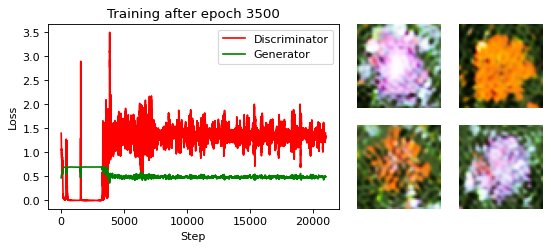

Summary after epoch 3600
Training progress: 18%
Time elapsed: 3940 seconds
Current Discriminator Loss: 1.107
Current Generator Loss: 0.519
Total trained on images: 4320000
Total weight adjustments: 21600


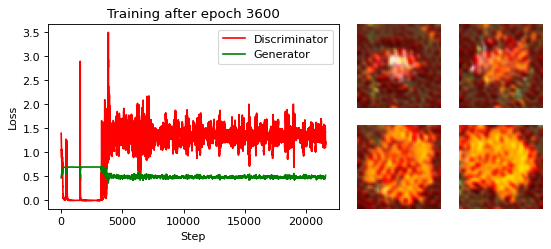

Summary after epoch 3700
Training progress: 18%
Time elapsed: 4049 seconds
Current Discriminator Loss: 1.327
Current Generator Loss: 0.473
Total trained on images: 4440000
Total weight adjustments: 22200


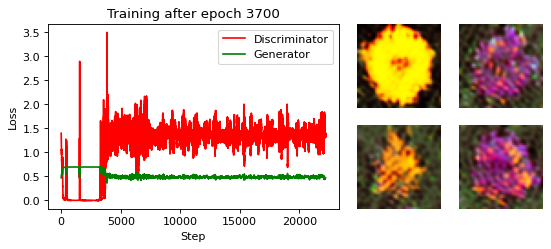

Summary after epoch 3800
Training progress: 19%
Time elapsed: 4158 seconds
Current Discriminator Loss: 1.518
Current Generator Loss: 0.481
Total trained on images: 4560000
Total weight adjustments: 22800


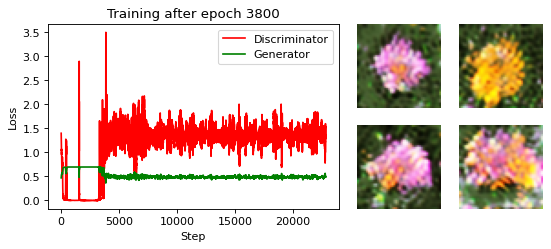

Summary after epoch 3900
Training progress: 20%
Time elapsed: 4268 seconds
Current Discriminator Loss: 1.420
Current Generator Loss: 0.439
Total trained on images: 4680000
Total weight adjustments: 23400


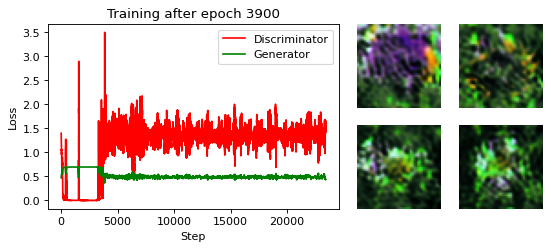

Summary after epoch 4000
Training progress: 20%
Time elapsed: 4377 seconds
Current Discriminator Loss: 1.080
Current Generator Loss: 0.520
Total trained on images: 4800000
Total weight adjustments: 24000


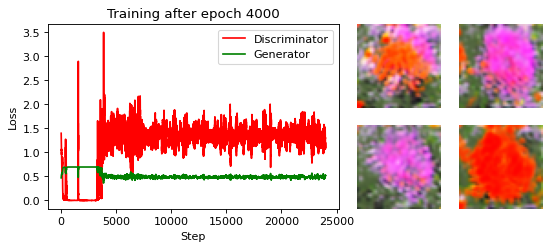

Summary after epoch 4100
Training progress: 20%
Time elapsed: 4486 seconds
Current Discriminator Loss: 1.041
Current Generator Loss: 0.495
Total trained on images: 4920000
Total weight adjustments: 24600


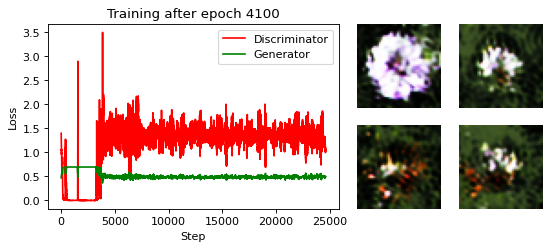

Summary after epoch 4200
Training progress: 21%
Time elapsed: 4595 seconds
Current Discriminator Loss: 1.352
Current Generator Loss: 0.476
Total trained on images: 5040000
Total weight adjustments: 25200


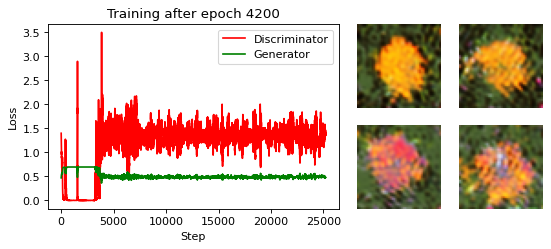

Summary after epoch 4300
Training progress: 22%
Time elapsed: 4704 seconds
Current Discriminator Loss: 1.296
Current Generator Loss: 0.501
Total trained on images: 5160000
Total weight adjustments: 25800


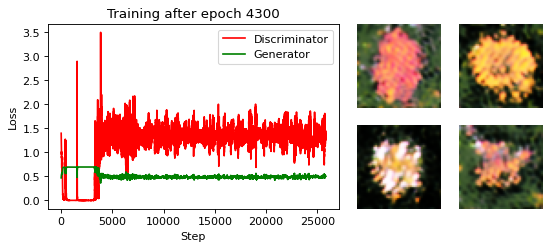

Summary after epoch 4400
Training progress: 22%
Time elapsed: 4812 seconds
Current Discriminator Loss: 1.336
Current Generator Loss: 0.471
Total trained on images: 5280000
Total weight adjustments: 26400


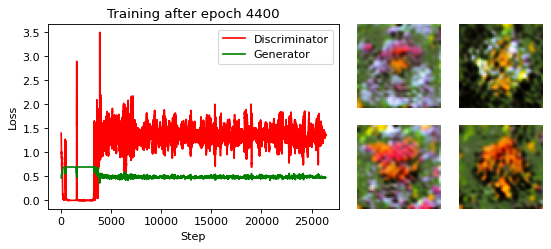

Summary after epoch 4500
Training progress: 22%
Time elapsed: 4920 seconds
Current Discriminator Loss: 1.321
Current Generator Loss: 0.484
Total trained on images: 5400000
Total weight adjustments: 27000


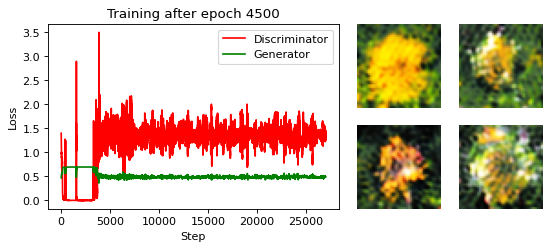

Summary after epoch 4600
Training progress: 23%
Time elapsed: 5029 seconds
Current Discriminator Loss: 1.283
Current Generator Loss: 0.494
Total trained on images: 5520000
Total weight adjustments: 27600


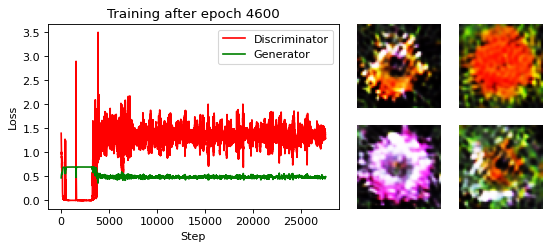

Summary after epoch 4700
Training progress: 24%
Time elapsed: 5138 seconds
Current Discriminator Loss: 1.404
Current Generator Loss: 0.458
Total trained on images: 5640000
Total weight adjustments: 28200


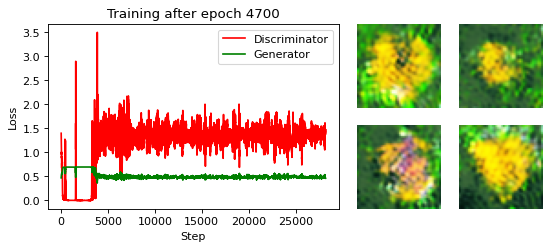

Summary after epoch 4800
Training progress: 24%
Time elapsed: 5247 seconds
Current Discriminator Loss: 1.276
Current Generator Loss: 0.475
Total trained on images: 5760000
Total weight adjustments: 28800


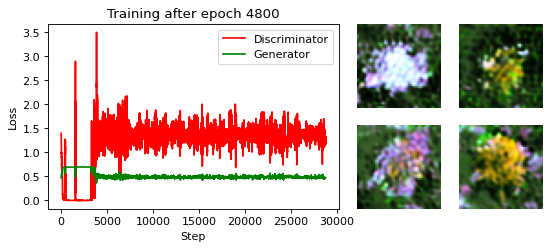

Summary after epoch 4900
Training progress: 24%
Time elapsed: 5354 seconds
Current Discriminator Loss: 1.217
Current Generator Loss: 0.498
Total trained on images: 5880000
Total weight adjustments: 29400


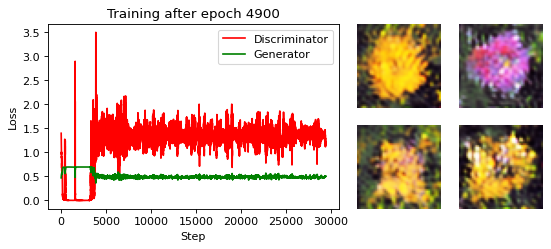

Summary after epoch 5000
Training progress: 25%
Time elapsed: 5462 seconds
Current Discriminator Loss: 1.372
Current Generator Loss: 0.492
Total trained on images: 6000000
Total weight adjustments: 30000


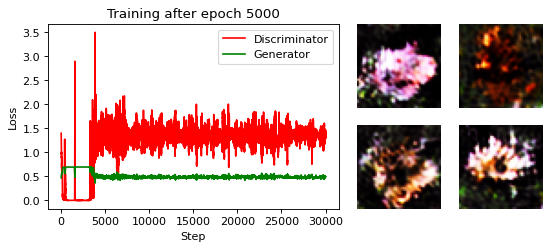

Summary after epoch 5100
Training progress: 26%
Time elapsed: 5568 seconds
Current Discriminator Loss: 1.231
Current Generator Loss: 0.465
Total trained on images: 6120000
Total weight adjustments: 30600


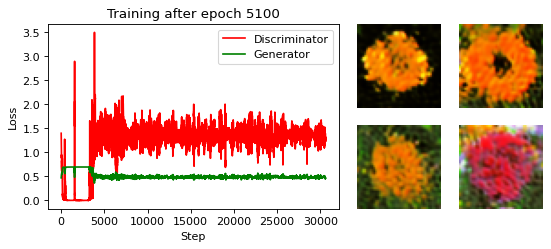

Summary after epoch 5200
Training progress: 26%
Time elapsed: 5675 seconds
Current Discriminator Loss: 1.366
Current Generator Loss: 0.504
Total trained on images: 6240000
Total weight adjustments: 31200


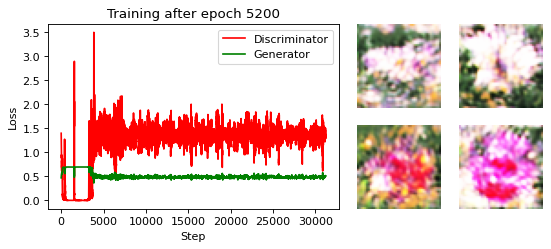

Summary after epoch 5300
Training progress: 26%
Time elapsed: 5782 seconds
Current Discriminator Loss: 1.252
Current Generator Loss: 0.482
Total trained on images: 6360000
Total weight adjustments: 31800


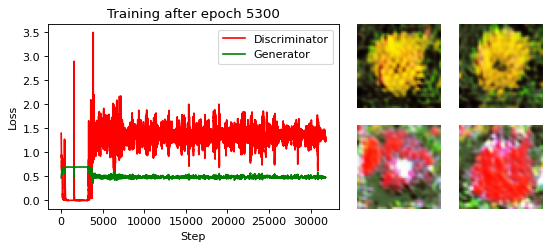

Summary after epoch 5400
Training progress: 27%
Time elapsed: 5889 seconds
Current Discriminator Loss: 1.270
Current Generator Loss: 0.486
Total trained on images: 6480000
Total weight adjustments: 32400


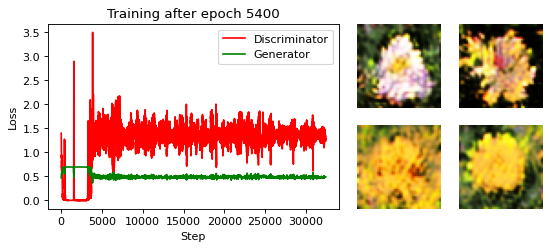

Summary after epoch 5500
Training progress: 28%
Time elapsed: 5996 seconds
Current Discriminator Loss: 1.258
Current Generator Loss: 0.494
Total trained on images: 6600000
Total weight adjustments: 33000


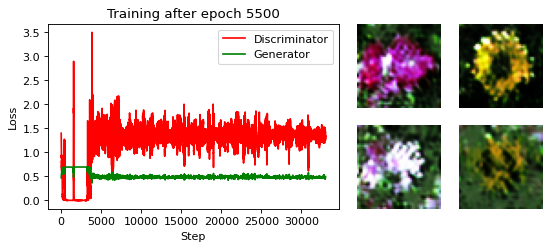

Summary after epoch 5600
Training progress: 28%
Time elapsed: 6104 seconds
Current Discriminator Loss: 1.372
Current Generator Loss: 0.480
Total trained on images: 6720000
Total weight adjustments: 33600


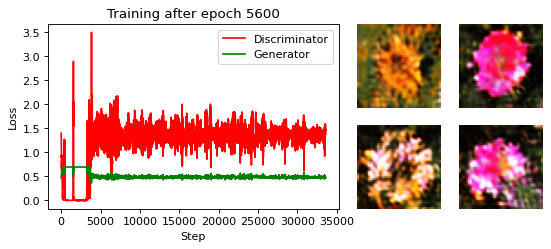

Summary after epoch 5700
Training progress: 28%
Time elapsed: 6212 seconds
Current Discriminator Loss: 1.286
Current Generator Loss: 0.473
Total trained on images: 6840000
Total weight adjustments: 34200


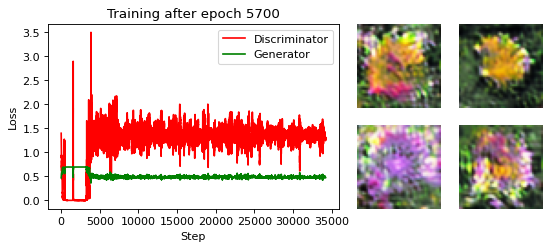

Summary after epoch 5800
Training progress: 29%
Time elapsed: 6320 seconds
Current Discriminator Loss: 1.294
Current Generator Loss: 0.478
Total trained on images: 6960000
Total weight adjustments: 34800


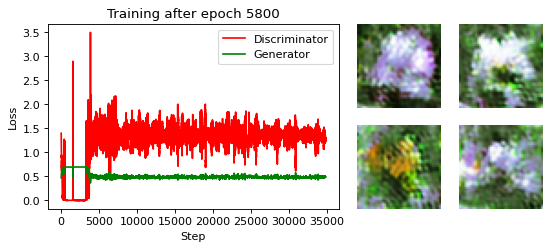

Summary after epoch 5900
Training progress: 30%
Time elapsed: 6427 seconds
Current Discriminator Loss: 1.179
Current Generator Loss: 0.471
Total trained on images: 7080000
Total weight adjustments: 35400


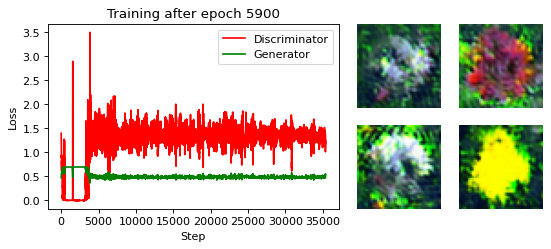

Summary after epoch 6000
Training progress: 30%
Time elapsed: 6535 seconds
Current Discriminator Loss: 1.340
Current Generator Loss: 0.494
Total trained on images: 7200000
Total weight adjustments: 36000


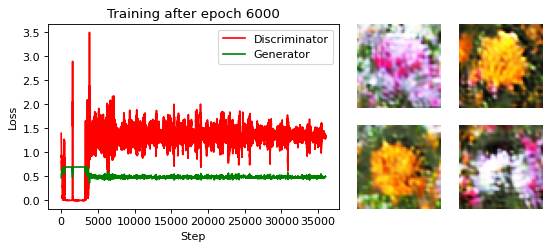

Summary after epoch 6100
Training progress: 30%
Time elapsed: 6643 seconds
Current Discriminator Loss: 1.336
Current Generator Loss: 0.477
Total trained on images: 7320000
Total weight adjustments: 36600


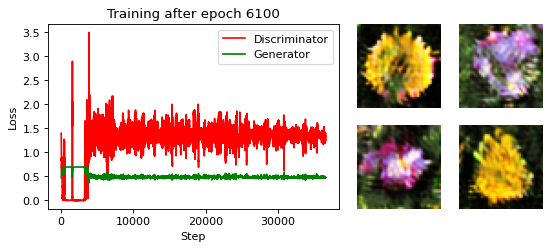

Summary after epoch 6200
Training progress: 31%
Time elapsed: 6751 seconds
Current Discriminator Loss: 1.382
Current Generator Loss: 0.474
Total trained on images: 7440000
Total weight adjustments: 37200


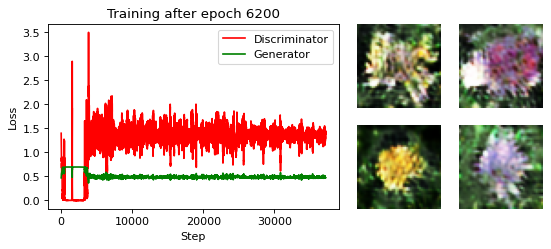

Summary after epoch 6300
Training progress: 32%
Time elapsed: 6859 seconds
Current Discriminator Loss: 1.196
Current Generator Loss: 0.472
Total trained on images: 7560000
Total weight adjustments: 37800


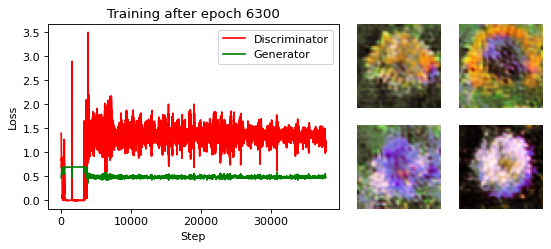

Summary after epoch 6400
Training progress: 32%
Time elapsed: 6965 seconds
Current Discriminator Loss: 1.377
Current Generator Loss: 0.480
Total trained on images: 7680000
Total weight adjustments: 38400


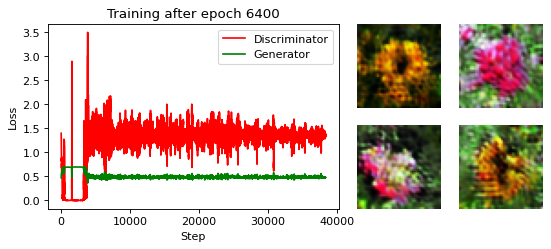

Summary after epoch 6500
Training progress: 32%
Time elapsed: 7073 seconds
Current Discriminator Loss: 1.381
Current Generator Loss: 0.476
Total trained on images: 7800000
Total weight adjustments: 39000


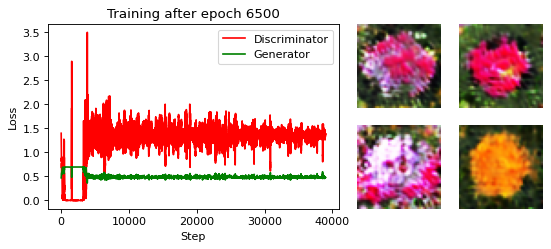

Summary after epoch 6600
Training progress: 33%
Time elapsed: 7181 seconds
Current Discriminator Loss: 1.318
Current Generator Loss: 0.488
Total trained on images: 7920000
Total weight adjustments: 39600


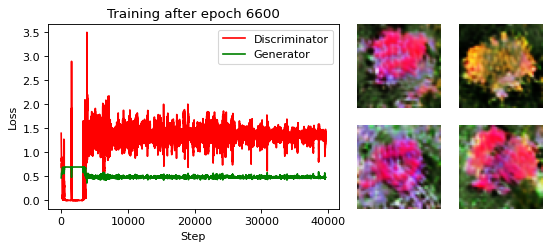

Summary after epoch 6700
Training progress: 34%
Time elapsed: 7288 seconds
Current Discriminator Loss: 1.262
Current Generator Loss: 0.489
Total trained on images: 8040000
Total weight adjustments: 40200


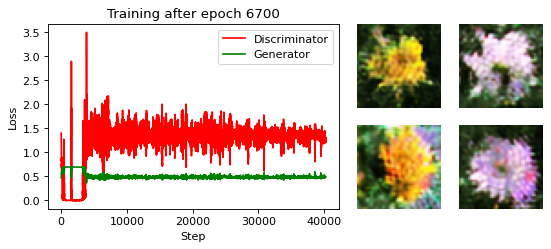

Summary after epoch 6800
Training progress: 34%
Time elapsed: 7396 seconds
Current Discriminator Loss: 1.394
Current Generator Loss: 0.495
Total trained on images: 8160000
Total weight adjustments: 40800


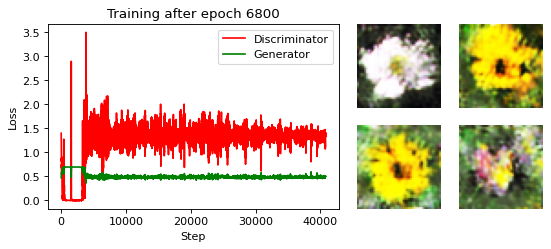

Summary after epoch 6900
Training progress: 34%
Time elapsed: 7503 seconds
Current Discriminator Loss: 1.257
Current Generator Loss: 0.490
Total trained on images: 8280000
Total weight adjustments: 41400


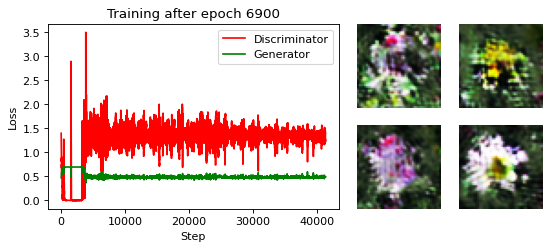

Summary after epoch 7000
Training progress: 35%
Time elapsed: 7610 seconds
Current Discriminator Loss: 1.346
Current Generator Loss: 0.490
Total trained on images: 8400000
Total weight adjustments: 42000


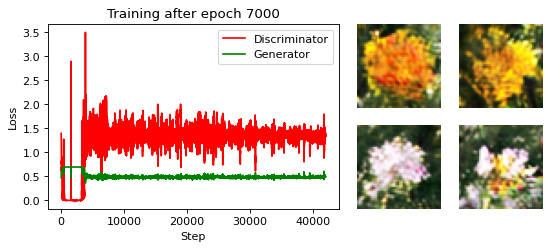

Summary after epoch 7100
Training progress: 36%
Time elapsed: 7716 seconds
Current Discriminator Loss: 1.256
Current Generator Loss: 0.474
Total trained on images: 8520000
Total weight adjustments: 42600


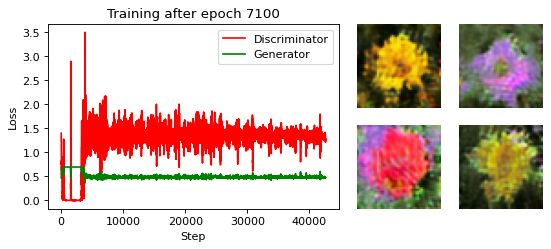

Summary after epoch 7200
Training progress: 36%
Time elapsed: 7823 seconds
Current Discriminator Loss: 1.404
Current Generator Loss: 0.495
Total trained on images: 8640000
Total weight adjustments: 43200


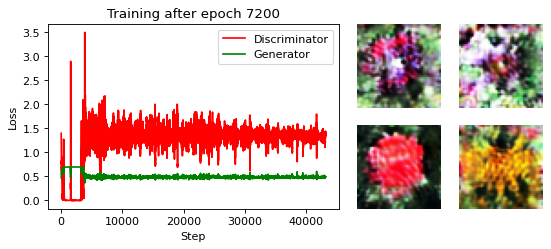

Summary after epoch 7300
Training progress: 36%
Time elapsed: 7929 seconds
Current Discriminator Loss: 1.289
Current Generator Loss: 0.491
Total trained on images: 8760000
Total weight adjustments: 43800


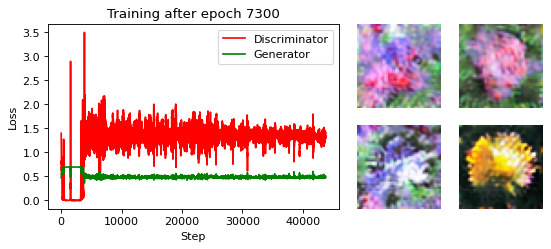

Summary after epoch 7400
Training progress: 37%
Time elapsed: 8035 seconds
Current Discriminator Loss: 1.303
Current Generator Loss: 0.491
Total trained on images: 8880000
Total weight adjustments: 44400


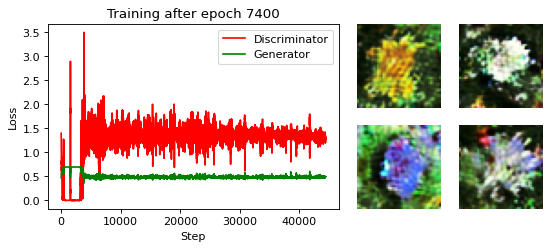

Summary after epoch 7500
Training progress: 38%
Time elapsed: 8143 seconds
Current Discriminator Loss: 1.338
Current Generator Loss: 0.514
Total trained on images: 9000000
Total weight adjustments: 45000


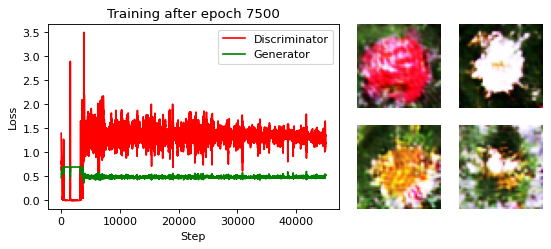

Summary after epoch 7600
Training progress: 38%
Time elapsed: 8251 seconds
Current Discriminator Loss: 1.260
Current Generator Loss: 0.487
Total trained on images: 9120000
Total weight adjustments: 45600


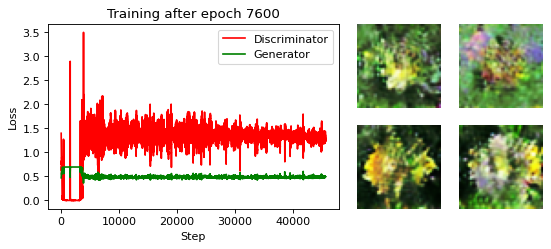

Summary after epoch 7700
Training progress: 38%
Time elapsed: 8360 seconds
Current Discriminator Loss: 1.280
Current Generator Loss: 0.475
Total trained on images: 9240000
Total weight adjustments: 46200


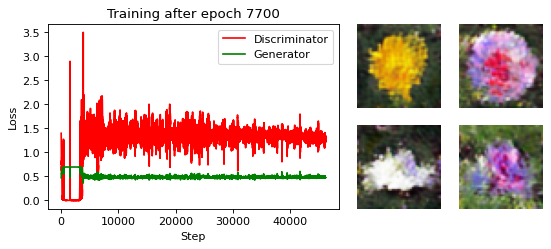

Summary after epoch 7800
Training progress: 39%
Time elapsed: 8467 seconds
Current Discriminator Loss: 1.236
Current Generator Loss: 0.501
Total trained on images: 9360000
Total weight adjustments: 46800


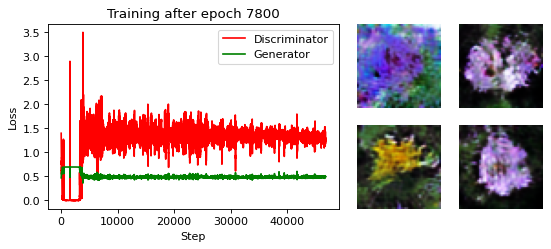

Summary after epoch 7900
Training progress: 40%
Time elapsed: 8575 seconds
Current Discriminator Loss: 1.324
Current Generator Loss: 0.485
Total trained on images: 9480000
Total weight adjustments: 47400


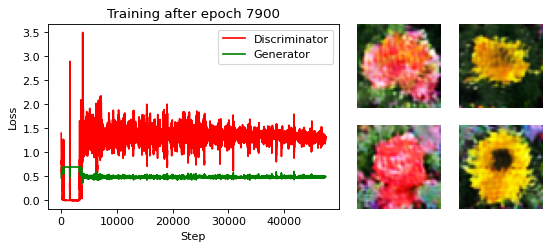

Summary after epoch 8000
Training progress: 40%
Time elapsed: 8681 seconds
Current Discriminator Loss: 1.319
Current Generator Loss: 0.490
Total trained on images: 9600000
Total weight adjustments: 48000


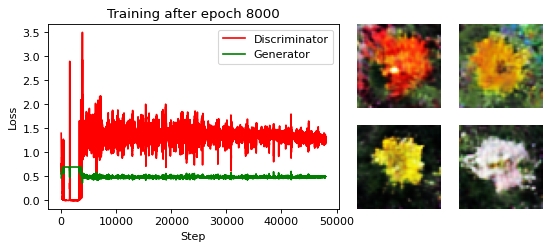

Summary after epoch 8100
Training progress: 40%
Time elapsed: 8788 seconds
Current Discriminator Loss: 1.382
Current Generator Loss: 0.476
Total trained on images: 9720000
Total weight adjustments: 48600


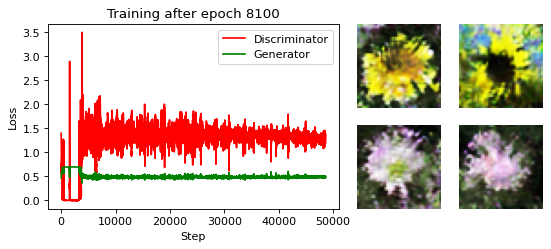

Summary after epoch 8200
Training progress: 41%
Time elapsed: 8894 seconds
Current Discriminator Loss: 1.272
Current Generator Loss: 0.483
Total trained on images: 9840000
Total weight adjustments: 49200


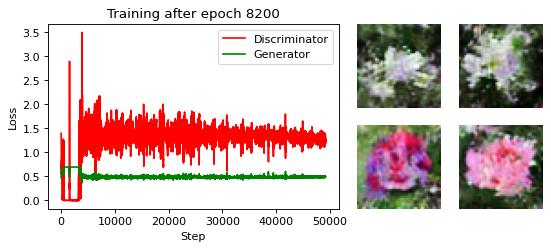

Summary after epoch 8300
Training progress: 42%
Time elapsed: 9001 seconds
Current Discriminator Loss: 1.264
Current Generator Loss: 0.486
Total trained on images: 9960000
Total weight adjustments: 49800


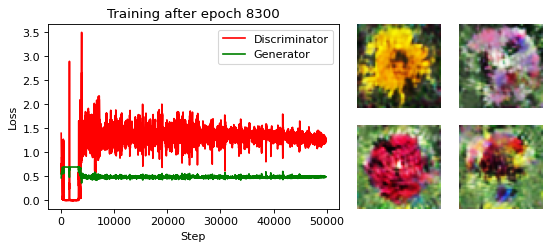

Summary after epoch 8400
Training progress: 42%
Time elapsed: 9109 seconds
Current Discriminator Loss: 1.221
Current Generator Loss: 0.499
Total trained on images: 10080000
Total weight adjustments: 50400


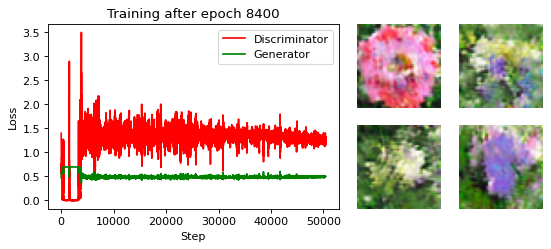

Summary after epoch 8500
Training progress: 42%
Time elapsed: 9216 seconds
Current Discriminator Loss: 1.260
Current Generator Loss: 0.487
Total trained on images: 10200000
Total weight adjustments: 51000


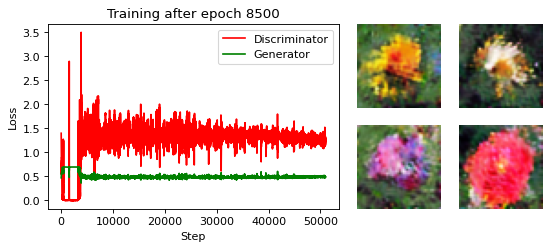

Summary after epoch 8600
Training progress: 43%
Time elapsed: 9323 seconds
Current Discriminator Loss: 1.229
Current Generator Loss: 0.494
Total trained on images: 10320000
Total weight adjustments: 51600


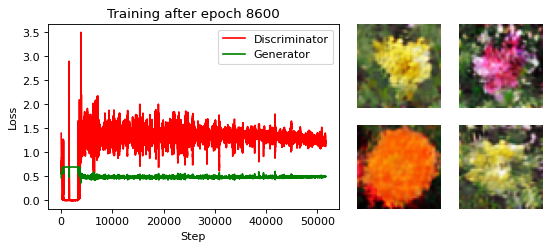

Summary after epoch 8700
Training progress: 44%
Time elapsed: 9429 seconds
Current Discriminator Loss: 1.310
Current Generator Loss: 0.498
Total trained on images: 10440000
Total weight adjustments: 52200


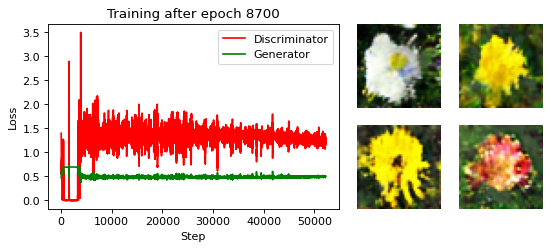

Summary after epoch 8800
Training progress: 44%
Time elapsed: 9536 seconds
Current Discriminator Loss: 1.323
Current Generator Loss: 0.480
Total trained on images: 10560000
Total weight adjustments: 52800


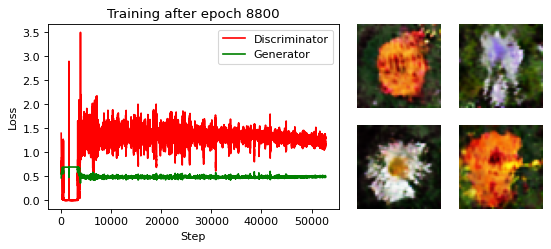

Summary after epoch 8900
Training progress: 44%
Time elapsed: 9643 seconds
Current Discriminator Loss: 1.268
Current Generator Loss: 0.493
Total trained on images: 10680000
Total weight adjustments: 53400


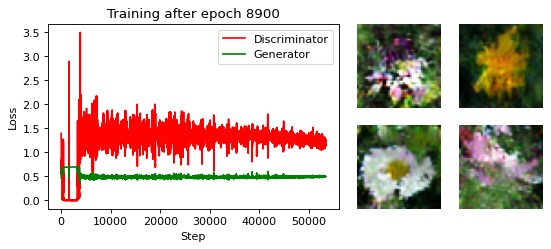

Summary after epoch 9000
Training progress: 45%
Time elapsed: 9751 seconds
Current Discriminator Loss: 1.251
Current Generator Loss: 0.487
Total trained on images: 10800000
Total weight adjustments: 54000


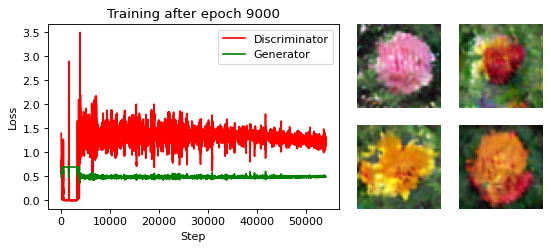

Summary after epoch 9100
Training progress: 46%
Time elapsed: 9858 seconds
Current Discriminator Loss: 1.170
Current Generator Loss: 0.510
Total trained on images: 10920000
Total weight adjustments: 54600


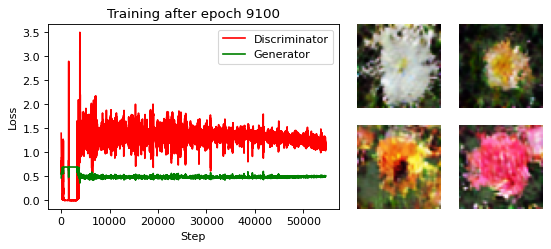

Summary after epoch 9200
Training progress: 46%
Time elapsed: 9965 seconds
Current Discriminator Loss: 1.210
Current Generator Loss: 0.501
Total trained on images: 11040000
Total weight adjustments: 55200


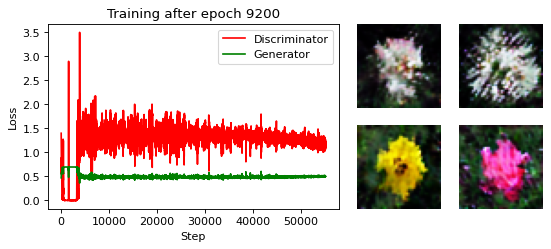

Summary after epoch 9300
Training progress: 46%
Time elapsed: 10072 seconds
Current Discriminator Loss: 1.178
Current Generator Loss: 0.520
Total trained on images: 11160000
Total weight adjustments: 55800


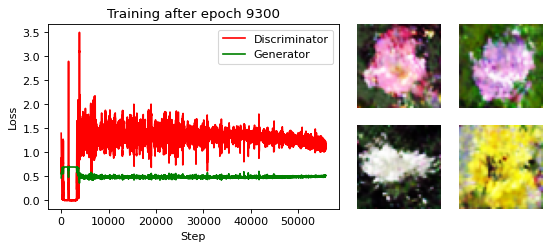

Summary after epoch 9400
Training progress: 47%
Time elapsed: 10179 seconds
Current Discriminator Loss: 1.122
Current Generator Loss: 0.509
Total trained on images: 11280000
Total weight adjustments: 56400


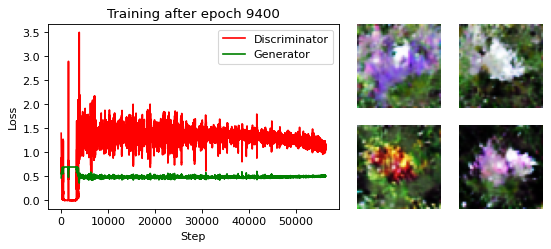

Summary after epoch 9500
Training progress: 48%
Time elapsed: 10286 seconds
Current Discriminator Loss: 1.128
Current Generator Loss: 0.506
Total trained on images: 11400000
Total weight adjustments: 57000


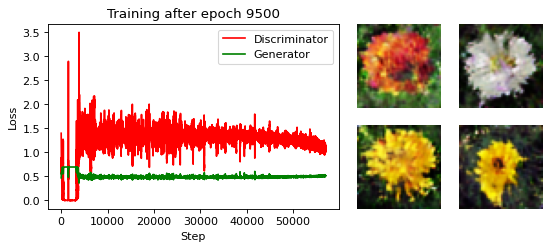

Summary after epoch 9600
Training progress: 48%
Time elapsed: 10394 seconds
Current Discriminator Loss: 1.100
Current Generator Loss: 0.513
Total trained on images: 11520000
Total weight adjustments: 57600


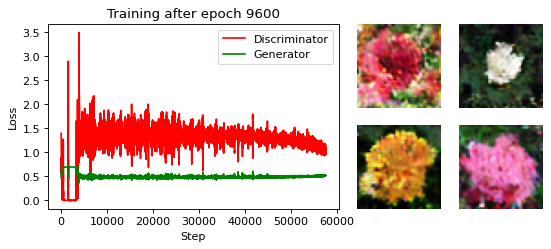

Summary after epoch 9700
Training progress: 48%
Time elapsed: 10501 seconds
Current Discriminator Loss: 1.116
Current Generator Loss: 0.518
Total trained on images: 11640000
Total weight adjustments: 58200


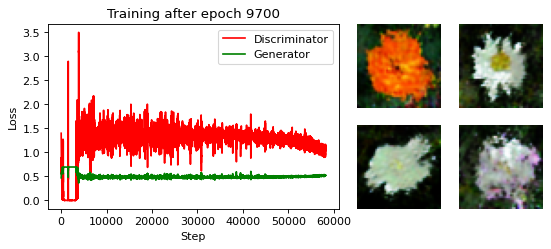

Summary after epoch 9800
Training progress: 49%
Time elapsed: 10608 seconds
Current Discriminator Loss: 1.026
Current Generator Loss: 0.522
Total trained on images: 11760000
Total weight adjustments: 58800


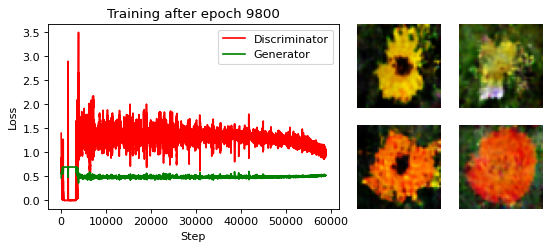

Summary after epoch 9900
Training progress: 50%
Time elapsed: 10715 seconds
Current Discriminator Loss: 1.033
Current Generator Loss: 0.531
Total trained on images: 11880000
Total weight adjustments: 59400


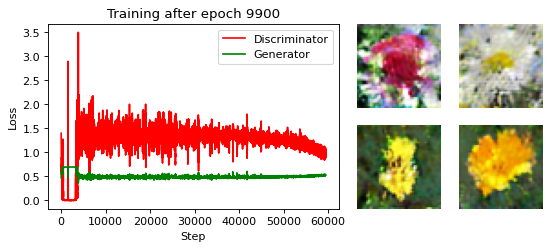

Summary after epoch 10000
Training progress: 50%
Time elapsed: 10821 seconds
Current Discriminator Loss: 0.971
Current Generator Loss: 0.537
Total trained on images: 12000000
Total weight adjustments: 60000


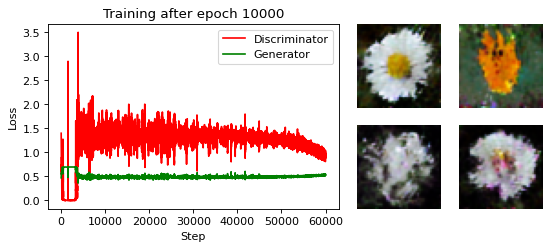

Summary after epoch 10100
Training progress: 50%
Time elapsed: 10929 seconds
Current Discriminator Loss: 1.016
Current Generator Loss: 0.526
Total trained on images: 12120000
Total weight adjustments: 60600


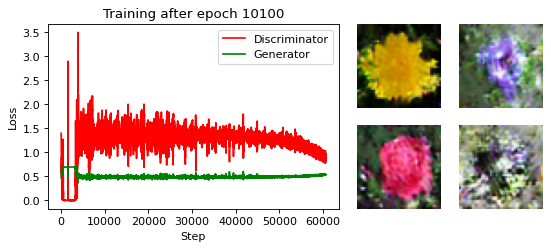

Summary after epoch 10200
Training progress: 51%
Time elapsed: 11037 seconds
Current Discriminator Loss: 0.967
Current Generator Loss: 0.536
Total trained on images: 12240000
Total weight adjustments: 61200


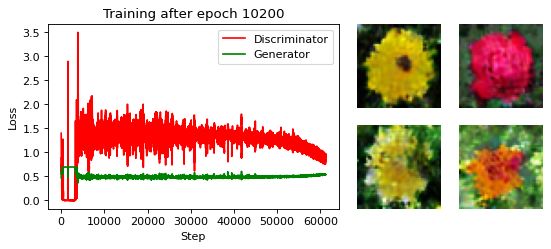

Summary after epoch 10300
Training progress: 52%
Time elapsed: 11144 seconds
Current Discriminator Loss: 0.892
Current Generator Loss: 0.543
Total trained on images: 12360000
Total weight adjustments: 61800


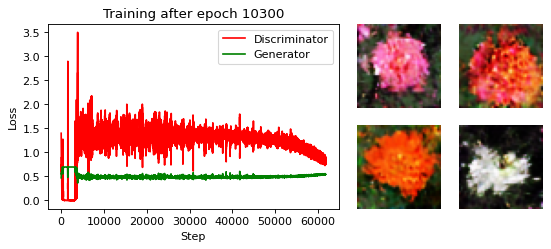

Summary after epoch 10400
Training progress: 52%
Time elapsed: 11252 seconds
Current Discriminator Loss: 0.850
Current Generator Loss: 0.546
Total trained on images: 12480000
Total weight adjustments: 62400


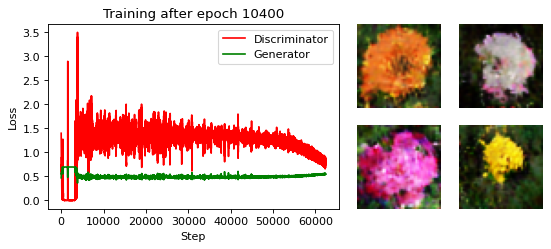

Summary after epoch 10500
Training progress: 52%
Time elapsed: 11360 seconds
Current Discriminator Loss: 0.819
Current Generator Loss: 0.555
Total trained on images: 12600000
Total weight adjustments: 63000


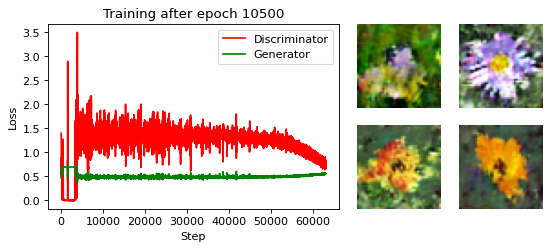

Summary after epoch 10600
Training progress: 53%
Time elapsed: 11469 seconds
Current Discriminator Loss: 0.797
Current Generator Loss: 0.564
Total trained on images: 12720000
Total weight adjustments: 63600


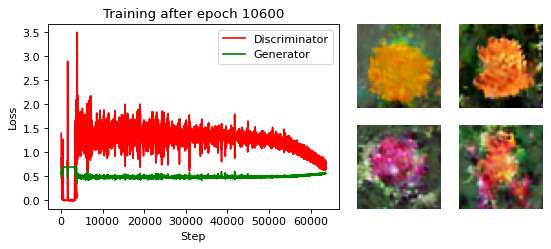

Summary after epoch 10700
Training progress: 54%
Time elapsed: 11576 seconds
Current Discriminator Loss: 0.779
Current Generator Loss: 0.572
Total trained on images: 12840000
Total weight adjustments: 64200


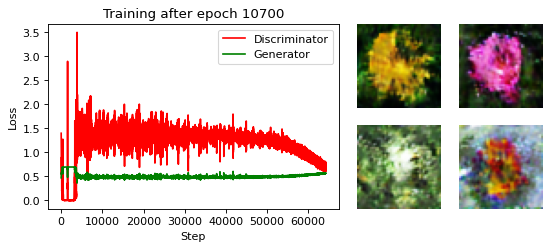

Summary after epoch 10800
Training progress: 54%
Time elapsed: 11684 seconds
Current Discriminator Loss: 0.711
Current Generator Loss: 0.568
Total trained on images: 12960000
Total weight adjustments: 64800


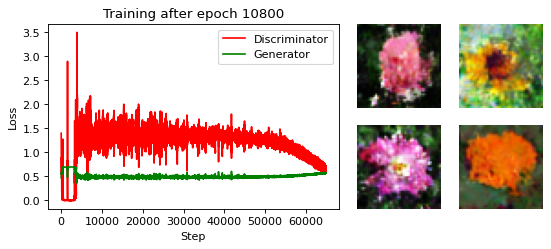

Summary after epoch 10900
Training progress: 55%
Time elapsed: 11790 seconds
Current Discriminator Loss: 0.669
Current Generator Loss: 0.578
Total trained on images: 13080000
Total weight adjustments: 65400


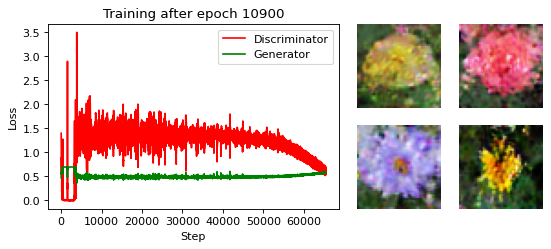

Summary after epoch 11000
Training progress: 55%
Time elapsed: 11897 seconds
Current Discriminator Loss: 0.640
Current Generator Loss: 0.583
Total trained on images: 13200000
Total weight adjustments: 66000


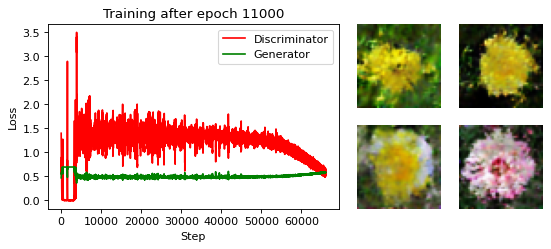

Summary after epoch 11100
Training progress: 56%
Time elapsed: 12003 seconds
Current Discriminator Loss: 0.618
Current Generator Loss: 0.591
Total trained on images: 13320000
Total weight adjustments: 66600


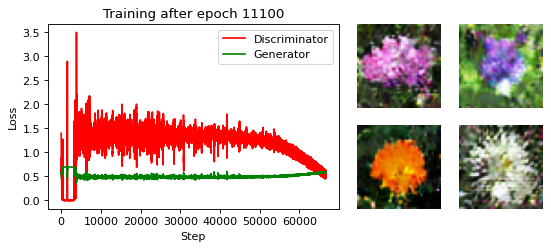

Summary after epoch 11200
Training progress: 56%
Time elapsed: 12111 seconds
Current Discriminator Loss: 0.569
Current Generator Loss: 0.592
Total trained on images: 13440000
Total weight adjustments: 67200


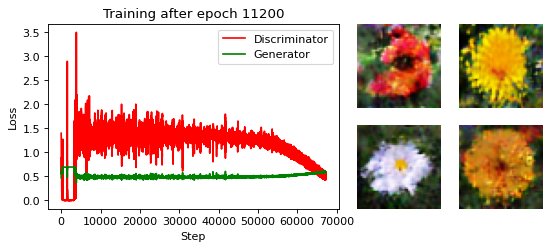

Summary after epoch 11300
Training progress: 56%
Time elapsed: 12219 seconds
Current Discriminator Loss: 0.538
Current Generator Loss: 0.599
Total trained on images: 13560000
Total weight adjustments: 67800


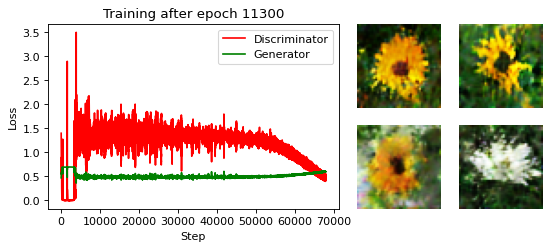

Summary after epoch 11400
Training progress: 57%
Time elapsed: 12326 seconds
Current Discriminator Loss: 0.502
Current Generator Loss: 0.602
Total trained on images: 13680000
Total weight adjustments: 68400


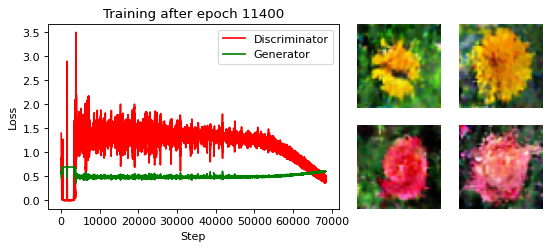

Summary after epoch 11500
Training progress: 57%
Time elapsed: 12433 seconds
Current Discriminator Loss: 0.461
Current Generator Loss: 0.606
Total trained on images: 13800000
Total weight adjustments: 69000


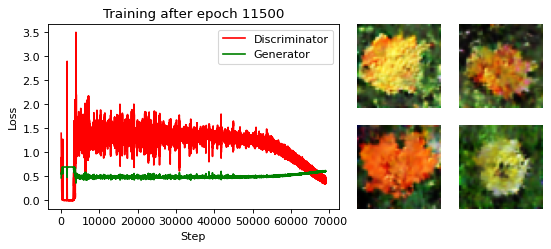

Summary after epoch 11600
Training progress: 58%
Time elapsed: 12540 seconds
Current Discriminator Loss: 0.433
Current Generator Loss: 0.612
Total trained on images: 13920000
Total weight adjustments: 69600


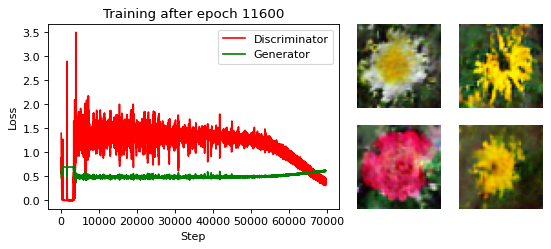

Summary after epoch 11700
Training progress: 58%
Time elapsed: 12648 seconds
Current Discriminator Loss: 0.410
Current Generator Loss: 0.614
Total trained on images: 14040000
Total weight adjustments: 70200


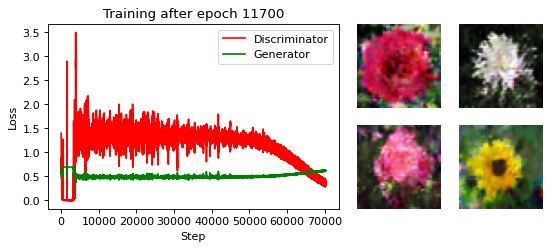

Summary after epoch 11800
Training progress: 59%
Time elapsed: 12754 seconds
Current Discriminator Loss: 0.365
Current Generator Loss: 0.625
Total trained on images: 14160000
Total weight adjustments: 70800


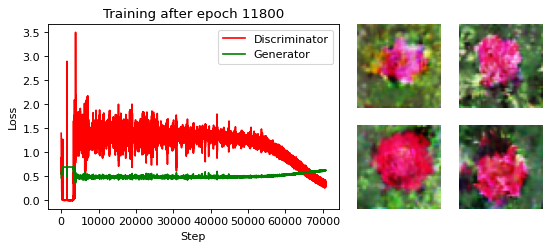

Summary after epoch 11900
Training progress: 60%
Time elapsed: 12861 seconds
Current Discriminator Loss: 0.337
Current Generator Loss: 0.634
Total trained on images: 14280000
Total weight adjustments: 71400


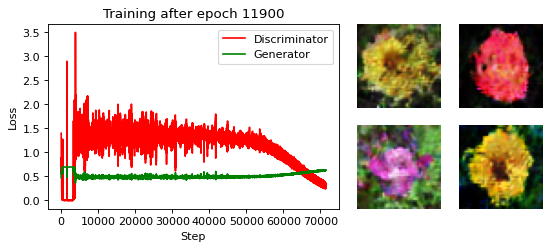

Summary after epoch 12000
Training progress: 60%
Time elapsed: 12968 seconds
Current Discriminator Loss: 0.338
Current Generator Loss: 0.623
Total trained on images: 14400000
Total weight adjustments: 72000


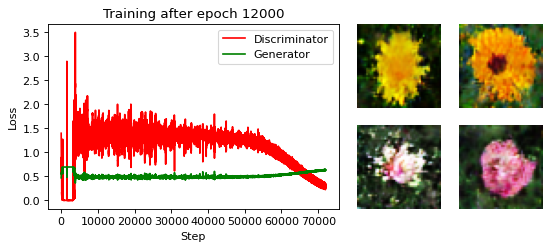

Summary after epoch 12100
Training progress: 60%
Time elapsed: 13076 seconds
Current Discriminator Loss: 0.290
Current Generator Loss: 0.637
Total trained on images: 14520000
Total weight adjustments: 72600


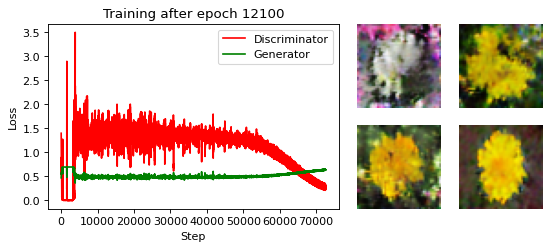

Summary after epoch 12200
Training progress: 61%
Time elapsed: 13183 seconds
Current Discriminator Loss: 0.268
Current Generator Loss: 0.641
Total trained on images: 14640000
Total weight adjustments: 73200


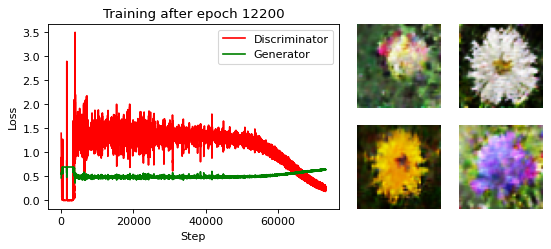

Summary after epoch 12300
Training progress: 62%
Time elapsed: 13290 seconds
Current Discriminator Loss: 0.256
Current Generator Loss: 0.647
Total trained on images: 14760000
Total weight adjustments: 73800


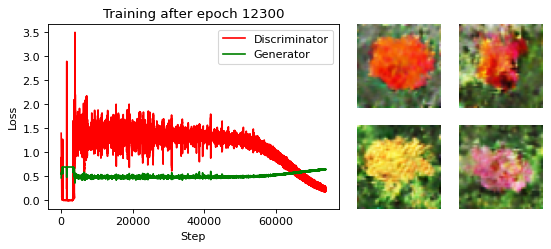

Summary after epoch 12400
Training progress: 62%
Time elapsed: 13397 seconds
Current Discriminator Loss: 0.239
Current Generator Loss: 0.645
Total trained on images: 14880000
Total weight adjustments: 74400


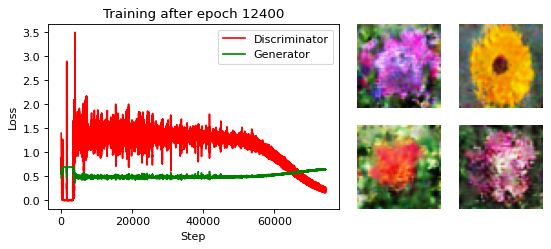

Summary after epoch 12500
Training progress: 62%
Time elapsed: 13505 seconds
Current Discriminator Loss: 0.223
Current Generator Loss: 0.649
Total trained on images: 15000000
Total weight adjustments: 75000


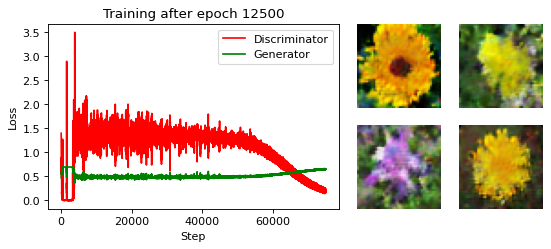

Summary after epoch 12600
Training progress: 63%
Time elapsed: 13612 seconds
Current Discriminator Loss: 0.201
Current Generator Loss: 0.658
Total trained on images: 15120000
Total weight adjustments: 75600


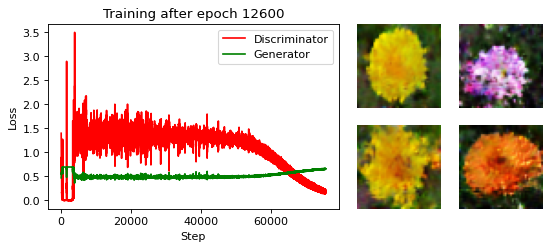

Summary after epoch 12700
Training progress: 64%
Time elapsed: 13719 seconds
Current Discriminator Loss: 0.170
Current Generator Loss: 0.662
Total trained on images: 15240000
Total weight adjustments: 76200


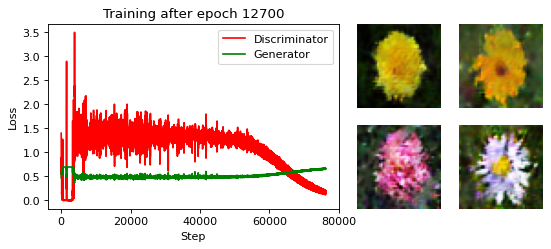

Summary after epoch 12800
Training progress: 64%
Time elapsed: 13826 seconds
Current Discriminator Loss: 0.170
Current Generator Loss: 0.657
Total trained on images: 15360000
Total weight adjustments: 76800


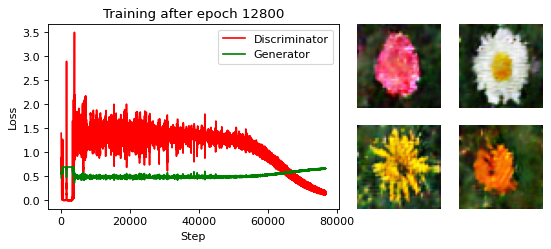

Summary after epoch 12900
Training progress: 64%
Time elapsed: 13934 seconds
Current Discriminator Loss: 0.150
Current Generator Loss: 0.666
Total trained on images: 15480000
Total weight adjustments: 77400


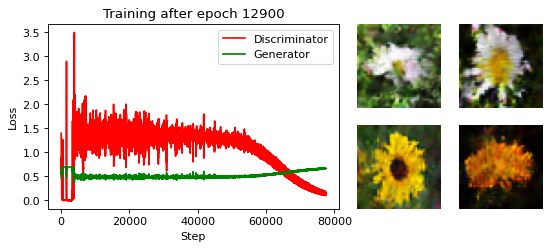

Summary after epoch 13000
Training progress: 65%
Time elapsed: 14041 seconds
Current Discriminator Loss: 0.148
Current Generator Loss: 0.664
Total trained on images: 15600000
Total weight adjustments: 78000


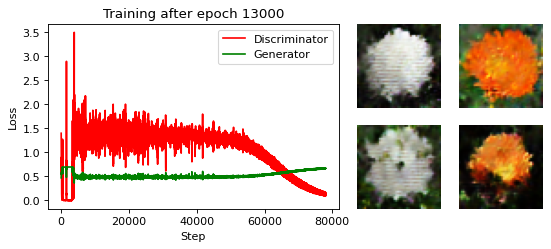

Summary after epoch 13100
Training progress: 66%
Time elapsed: 14147 seconds
Current Discriminator Loss: 0.126
Current Generator Loss: 0.662
Total trained on images: 15720000
Total weight adjustments: 78600


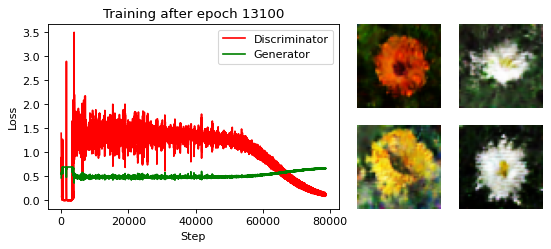

Summary after epoch 13200
Training progress: 66%
Time elapsed: 14255 seconds
Current Discriminator Loss: 0.118
Current Generator Loss: 0.669
Total trained on images: 15840000
Total weight adjustments: 79200


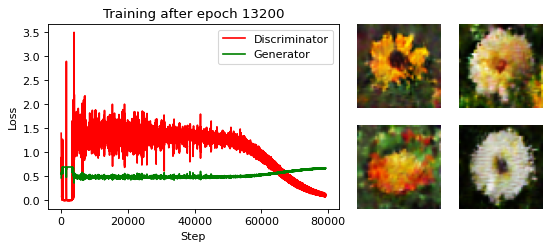

Summary after epoch 13300
Training progress: 66%
Time elapsed: 14363 seconds
Current Discriminator Loss: 0.100
Current Generator Loss: 0.672
Total trained on images: 15960000
Total weight adjustments: 79800


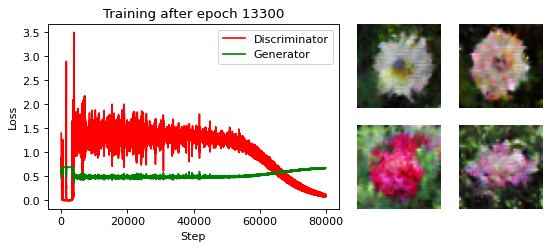

Summary after epoch 13400
Training progress: 67%
Time elapsed: 14471 seconds
Current Discriminator Loss: 0.094
Current Generator Loss: 0.671
Total trained on images: 16080000
Total weight adjustments: 80400


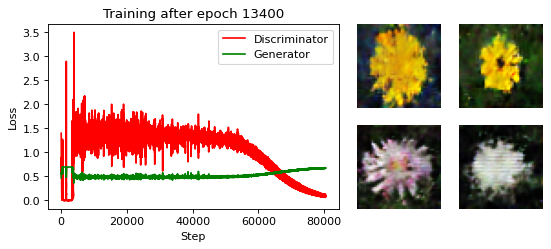

Summary after epoch 13500
Training progress: 68%
Time elapsed: 14579 seconds
Current Discriminator Loss: 0.087
Current Generator Loss: 0.675
Total trained on images: 16200000
Total weight adjustments: 81000


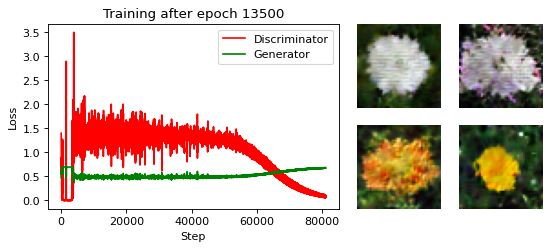

Summary after epoch 13600
Training progress: 68%
Time elapsed: 14686 seconds
Current Discriminator Loss: 0.086
Current Generator Loss: 0.675
Total trained on images: 16320000
Total weight adjustments: 81600


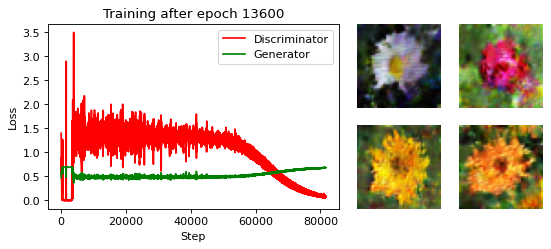

Summary after epoch 13700
Training progress: 68%
Time elapsed: 14794 seconds
Current Discriminator Loss: 0.072
Current Generator Loss: 0.677
Total trained on images: 16440000
Total weight adjustments: 82200


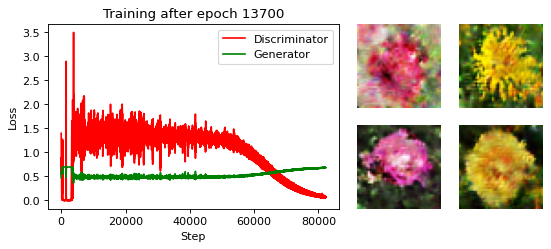

Summary after epoch 13800
Training progress: 69%
Time elapsed: 14903 seconds
Current Discriminator Loss: 0.065
Current Generator Loss: 0.678
Total trained on images: 16560000
Total weight adjustments: 82800


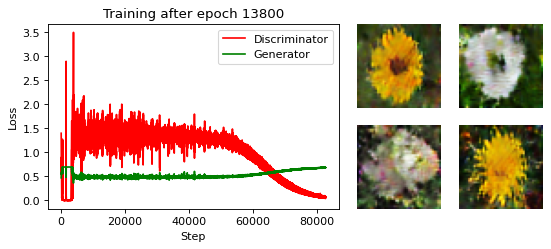

Summary after epoch 13900
Training progress: 70%
Time elapsed: 15011 seconds
Current Discriminator Loss: 0.065
Current Generator Loss: 0.681
Total trained on images: 16680000
Total weight adjustments: 83400


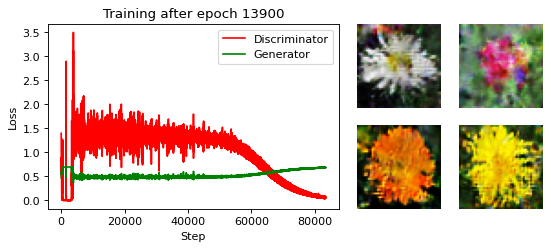

Summary after epoch 14000
Training progress: 70%
Time elapsed: 15118 seconds
Current Discriminator Loss: 0.054
Current Generator Loss: 0.680
Total trained on images: 16800000
Total weight adjustments: 84000


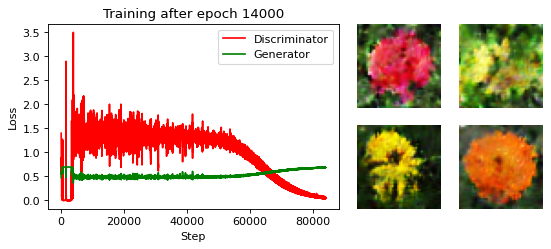

Summary after epoch 14100
Training progress: 70%
Time elapsed: 15225 seconds
Current Discriminator Loss: 0.051
Current Generator Loss: 0.682
Total trained on images: 16920000
Total weight adjustments: 84600


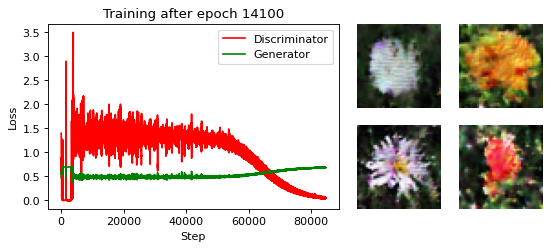

Summary after epoch 14200
Training progress: 71%
Time elapsed: 15335 seconds
Current Discriminator Loss: 0.049
Current Generator Loss: 0.684
Total trained on images: 17040000
Total weight adjustments: 85200


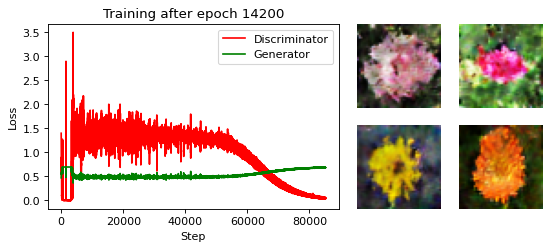

Summary after epoch 14300
Training progress: 72%
Time elapsed: 15442 seconds
Current Discriminator Loss: 0.039
Current Generator Loss: 0.684
Total trained on images: 17160000
Total weight adjustments: 85800


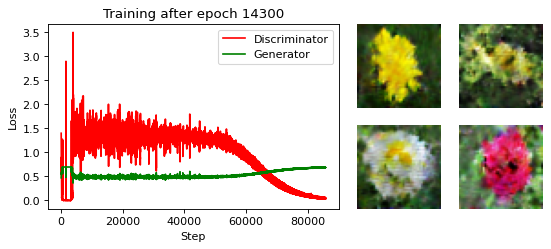

Summary after epoch 14400
Training progress: 72%
Time elapsed: 15550 seconds
Current Discriminator Loss: 0.039
Current Generator Loss: 0.684
Total trained on images: 17280000
Total weight adjustments: 86400


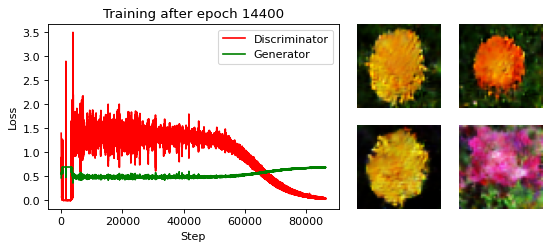

Summary after epoch 14500
Training progress: 72%
Time elapsed: 15656 seconds
Current Discriminator Loss: 0.031
Current Generator Loss: 0.686
Total trained on images: 17400000
Total weight adjustments: 87000


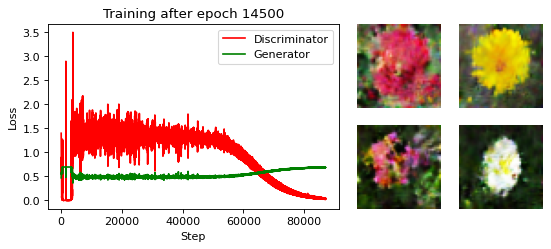

Summary after epoch 14600
Training progress: 73%
Time elapsed: 15763 seconds
Current Discriminator Loss: 0.030
Current Generator Loss: 0.686
Total trained on images: 17520000
Total weight adjustments: 87600


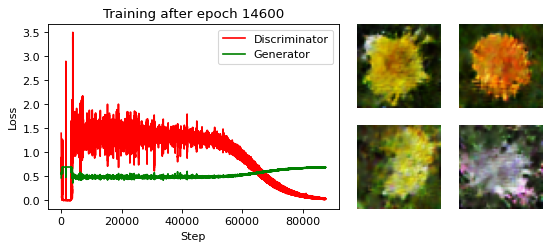

Summary after epoch 14700
Training progress: 74%
Time elapsed: 15870 seconds
Current Discriminator Loss: 0.031
Current Generator Loss: 0.685
Total trained on images: 17640000
Total weight adjustments: 88200


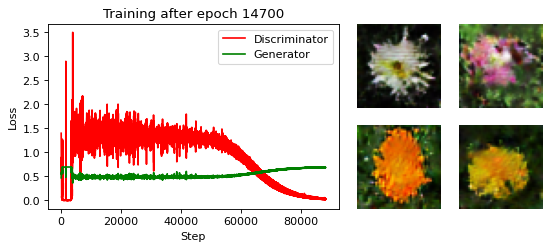

Summary after epoch 14800
Training progress: 74%
Time elapsed: 15976 seconds
Current Discriminator Loss: 0.027
Current Generator Loss: 0.687
Total trained on images: 17760000
Total weight adjustments: 88800


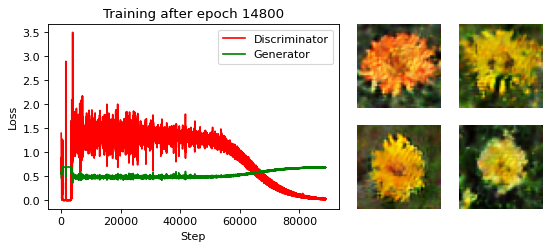

Summary after epoch 14900
Training progress: 74%
Time elapsed: 16084 seconds
Current Discriminator Loss: 0.025
Current Generator Loss: 0.687
Total trained on images: 17880000
Total weight adjustments: 89400


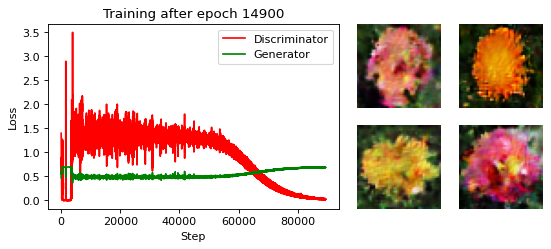

Summary after epoch 15000
Training progress: 75%
Time elapsed: 16191 seconds
Current Discriminator Loss: 0.027
Current Generator Loss: 0.685
Total trained on images: 18000000
Total weight adjustments: 90000


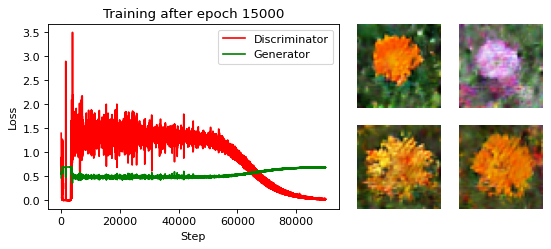

Summary after epoch 15100
Training progress: 76%
Time elapsed: 16297 seconds
Current Discriminator Loss: 0.020
Current Generator Loss: 0.688
Total trained on images: 18120000
Total weight adjustments: 90600


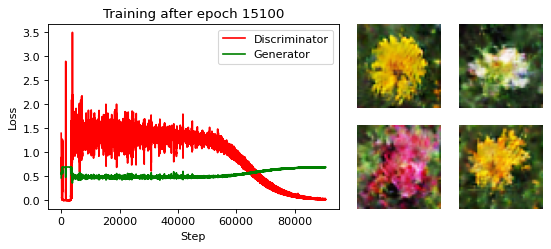

Summary after epoch 15200
Training progress: 76%
Time elapsed: 16404 seconds
Current Discriminator Loss: 0.017
Current Generator Loss: 0.688
Total trained on images: 18240000
Total weight adjustments: 91200


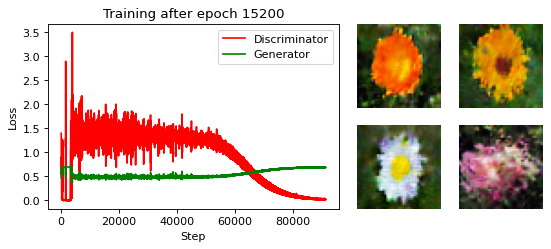

Summary after epoch 15300
Training progress: 76%
Time elapsed: 16511 seconds
Current Discriminator Loss: 0.023
Current Generator Loss: 0.688
Total trained on images: 18360000
Total weight adjustments: 91800


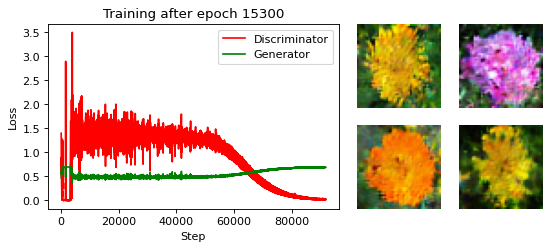

Summary after epoch 15400
Training progress: 77%
Time elapsed: 16619 seconds
Current Discriminator Loss: 0.019
Current Generator Loss: 0.686
Total trained on images: 18480000
Total weight adjustments: 92400


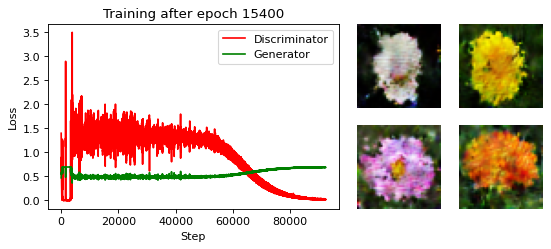

Summary after epoch 15500
Training progress: 78%
Time elapsed: 16726 seconds
Current Discriminator Loss: 0.015
Current Generator Loss: 0.689
Total trained on images: 18600000
Total weight adjustments: 93000


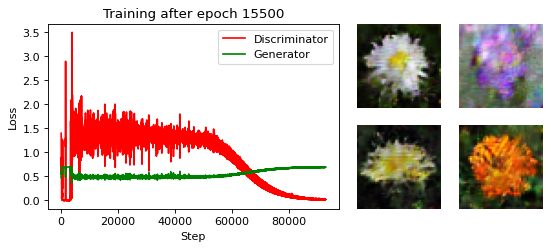

Summary after epoch 15600
Training progress: 78%
Time elapsed: 16834 seconds
Current Discriminator Loss: 0.014
Current Generator Loss: 0.690
Total trained on images: 18720000
Total weight adjustments: 93600


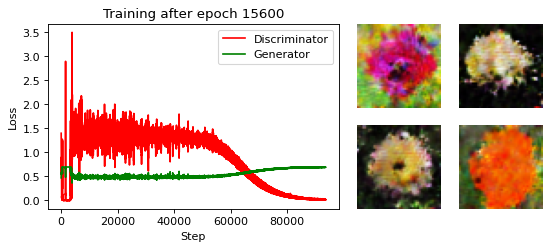

Summary after epoch 15700
Training progress: 78%
Time elapsed: 16942 seconds
Current Discriminator Loss: 0.012
Current Generator Loss: 0.690
Total trained on images: 18840000
Total weight adjustments: 94200


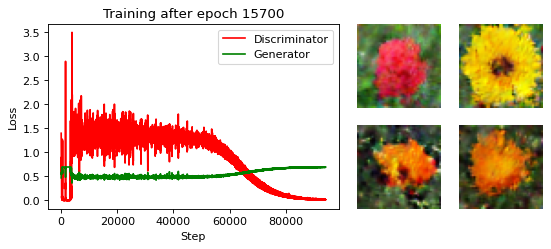

Summary after epoch 15800
Training progress: 79%
Time elapsed: 17049 seconds
Current Discriminator Loss: 0.015
Current Generator Loss: 0.688
Total trained on images: 18960000
Total weight adjustments: 94800


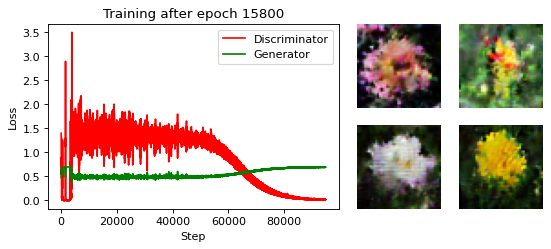

Summary after epoch 15900
Training progress: 80%
Time elapsed: 17157 seconds
Current Discriminator Loss: 0.011
Current Generator Loss: 0.689
Total trained on images: 19080000
Total weight adjustments: 95400


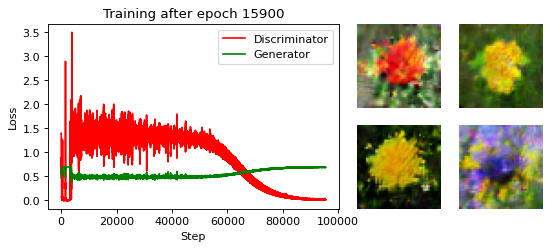

Summary after epoch 16000
Training progress: 80%
Time elapsed: 17265 seconds
Current Discriminator Loss: 0.020
Current Generator Loss: 0.688
Total trained on images: 19200000
Total weight adjustments: 96000


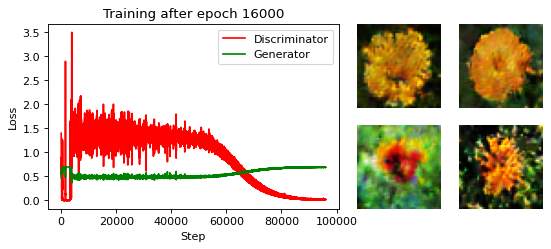

Summary after epoch 16100
Training progress: 80%
Time elapsed: 17373 seconds
Current Discriminator Loss: 0.010
Current Generator Loss: 0.690
Total trained on images: 19320000
Total weight adjustments: 96600


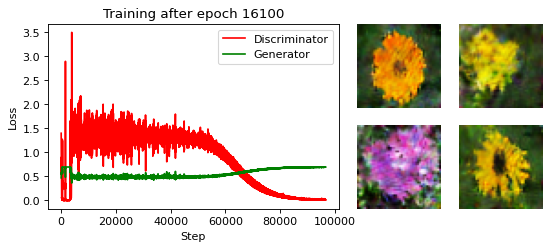

Summary after epoch 16200
Training progress: 81%
Time elapsed: 17480 seconds
Current Discriminator Loss: 0.010
Current Generator Loss: 0.689
Total trained on images: 19440000
Total weight adjustments: 97200


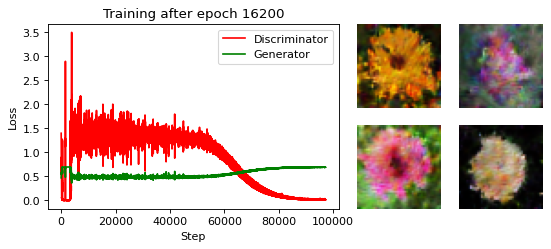

Summary after epoch 16300
Training progress: 82%
Time elapsed: 17587 seconds
Current Discriminator Loss: 0.014
Current Generator Loss: 0.689
Total trained on images: 19560000
Total weight adjustments: 97800


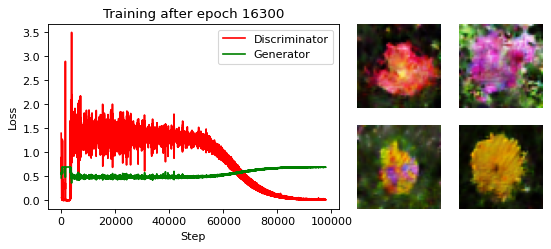

Summary after epoch 16400
Training progress: 82%
Time elapsed: 17693 seconds
Current Discriminator Loss: 0.009
Current Generator Loss: 0.690
Total trained on images: 19680000
Total weight adjustments: 98400


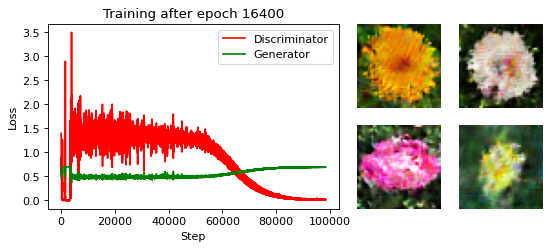

Summary after epoch 16500
Training progress: 82%
Time elapsed: 17800 seconds
Current Discriminator Loss: 0.009
Current Generator Loss: 0.690
Total trained on images: 19800000
Total weight adjustments: 99000


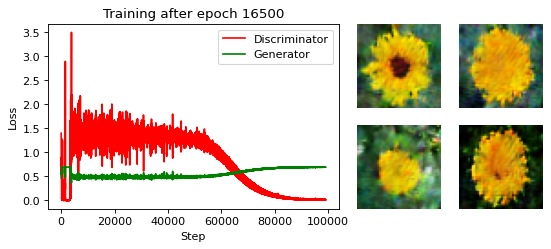

Summary after epoch 16600
Training progress: 83%
Time elapsed: 17907 seconds
Current Discriminator Loss: 0.011
Current Generator Loss: 0.689
Total trained on images: 19920000
Total weight adjustments: 99600


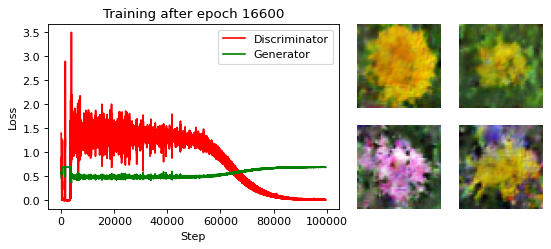

Summary after epoch 16700
Training progress: 84%
Time elapsed: 18014 seconds
Current Discriminator Loss: 0.017
Current Generator Loss: 0.689
Total trained on images: 20040000
Total weight adjustments: 100200


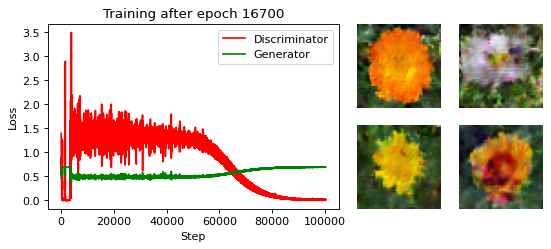

Summary after epoch 16800
Training progress: 84%
Time elapsed: 18122 seconds
Current Discriminator Loss: 0.007
Current Generator Loss: 0.691
Total trained on images: 20160000
Total weight adjustments: 100800


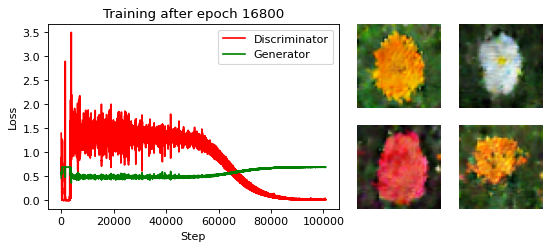

Summary after epoch 16900
Training progress: 84%
Time elapsed: 18230 seconds
Current Discriminator Loss: 0.007
Current Generator Loss: 0.690
Total trained on images: 20280000
Total weight adjustments: 101400


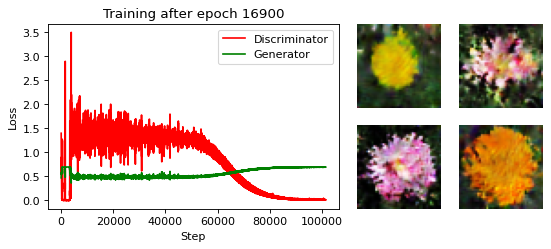

Summary after epoch 17000
Training progress: 85%
Time elapsed: 18336 seconds
Current Discriminator Loss: 0.006
Current Generator Loss: 0.691
Total trained on images: 20400000
Total weight adjustments: 102000


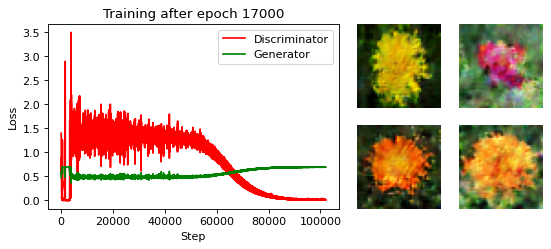

Summary after epoch 17100
Training progress: 86%
Time elapsed: 18443 seconds
Current Discriminator Loss: 0.005
Current Generator Loss: 0.692
Total trained on images: 20520000
Total weight adjustments: 102600


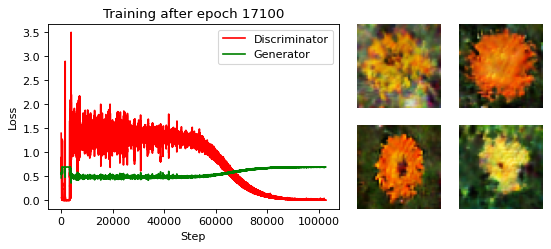

Summary after epoch 17200
Training progress: 86%
Time elapsed: 18551 seconds
Current Discriminator Loss: 0.007
Current Generator Loss: 0.690
Total trained on images: 20640000
Total weight adjustments: 103200


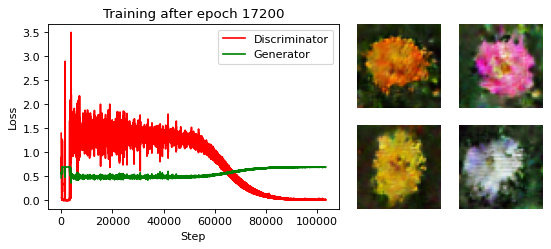

Summary after epoch 17300
Training progress: 86%
Time elapsed: 18659 seconds
Current Discriminator Loss: 0.005
Current Generator Loss: 0.692
Total trained on images: 20760000
Total weight adjustments: 103800


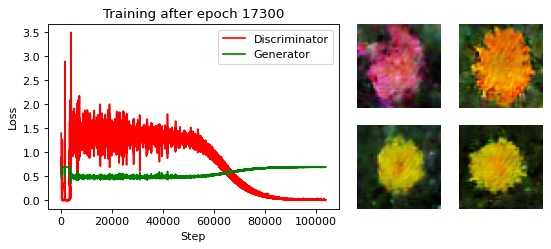

Summary after epoch 17400
Training progress: 87%
Time elapsed: 18766 seconds
Current Discriminator Loss: 0.009
Current Generator Loss: 0.690
Total trained on images: 20880000
Total weight adjustments: 104400


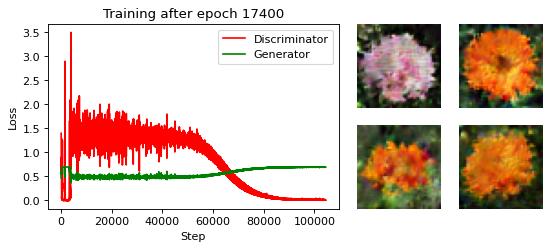

Summary after epoch 17500
Training progress: 88%
Time elapsed: 18873 seconds
Current Discriminator Loss: 0.006
Current Generator Loss: 0.692
Total trained on images: 21000000
Total weight adjustments: 105000


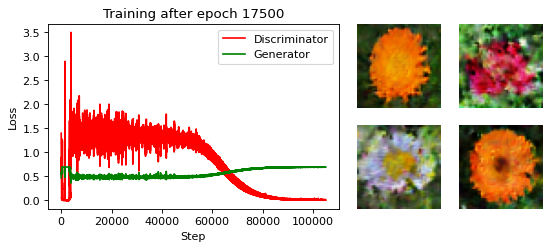

Summary after epoch 17600
Training progress: 88%
Time elapsed: 18980 seconds
Current Discriminator Loss: 0.005
Current Generator Loss: 0.691
Total trained on images: 21120000
Total weight adjustments: 105600


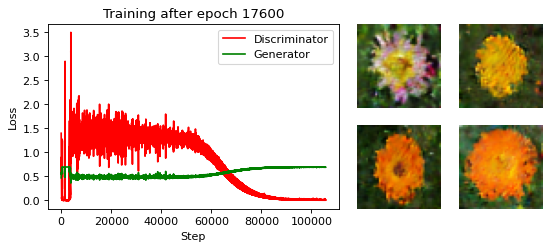

Summary after epoch 17700
Training progress: 88%
Time elapsed: 19087 seconds
Current Discriminator Loss: 0.004
Current Generator Loss: 0.692
Total trained on images: 21240000
Total weight adjustments: 106200


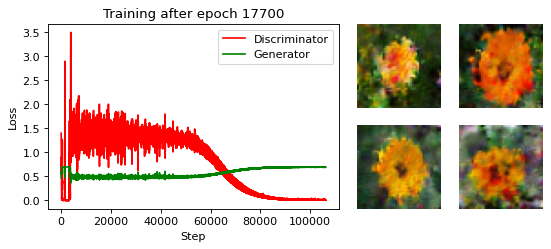

Summary after epoch 17800
Training progress: 89%
Time elapsed: 19194 seconds
Current Discriminator Loss: 0.004
Current Generator Loss: 0.692
Total trained on images: 21360000
Total weight adjustments: 106800


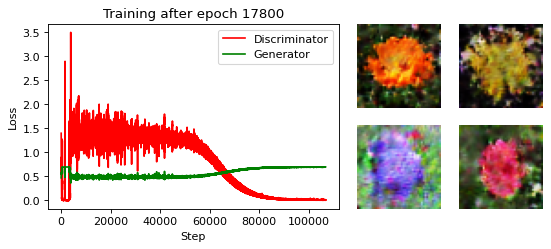

Summary after epoch 17900
Training progress: 90%
Time elapsed: 19301 seconds
Current Discriminator Loss: 0.003
Current Generator Loss: 0.692
Total trained on images: 21480000
Total weight adjustments: 107400


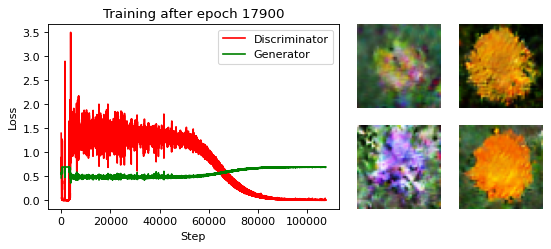

Summary after epoch 18000
Training progress: 90%
Time elapsed: 19408 seconds
Current Discriminator Loss: 0.004
Current Generator Loss: 0.691
Total trained on images: 21600000
Total weight adjustments: 108000


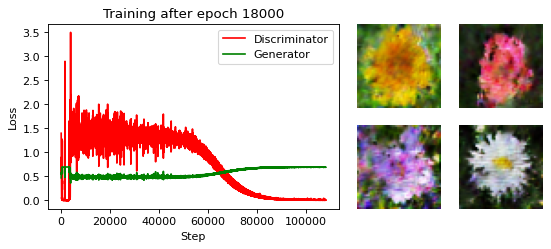

Summary after epoch 18100
Training progress: 90%
Time elapsed: 19515 seconds
Current Discriminator Loss: 0.004
Current Generator Loss: 0.691
Total trained on images: 21720000
Total weight adjustments: 108600


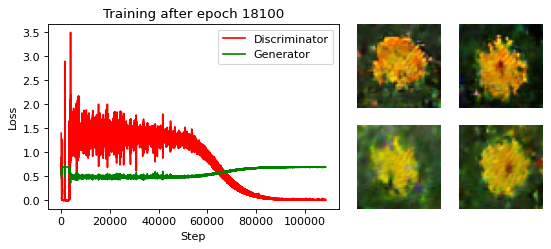

Summary after epoch 18200
Training progress: 91%
Time elapsed: 19622 seconds
Current Discriminator Loss: 0.004
Current Generator Loss: 0.691
Total trained on images: 21840000
Total weight adjustments: 109200


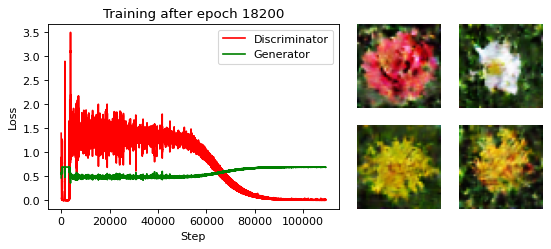

Summary after epoch 18300
Training progress: 92%
Time elapsed: 19730 seconds
Current Discriminator Loss: 0.004
Current Generator Loss: 0.691
Total trained on images: 21960000
Total weight adjustments: 109800


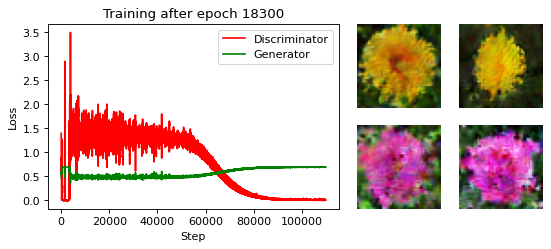

Summary after epoch 18400
Training progress: 92%
Time elapsed: 19838 seconds
Current Discriminator Loss: 0.004
Current Generator Loss: 0.691
Total trained on images: 22080000
Total weight adjustments: 110400


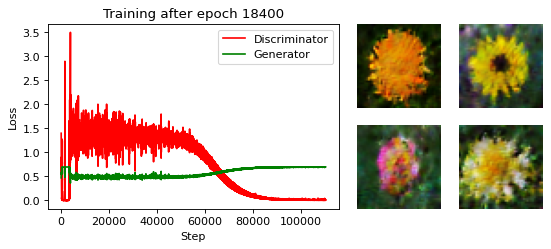

Summary after epoch 18500
Training progress: 92%
Time elapsed: 19945 seconds
Current Discriminator Loss: 0.005
Current Generator Loss: 0.691
Total trained on images: 22200000
Total weight adjustments: 111000


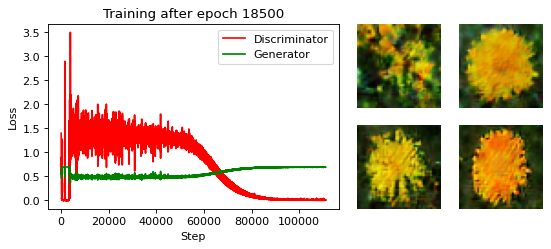

Summary after epoch 18600
Training progress: 93%
Time elapsed: 20053 seconds
Current Discriminator Loss: 0.005
Current Generator Loss: 0.691
Total trained on images: 22320000
Total weight adjustments: 111600


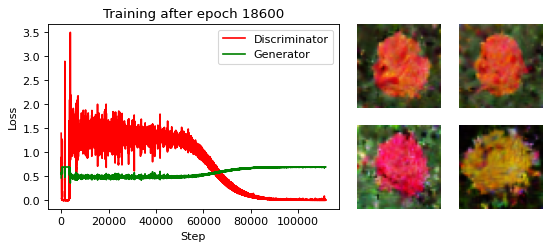

Summary after epoch 18700
Training progress: 94%
Time elapsed: 20160 seconds
Current Discriminator Loss: 0.007
Current Generator Loss: 0.690
Total trained on images: 22440000
Total weight adjustments: 112200


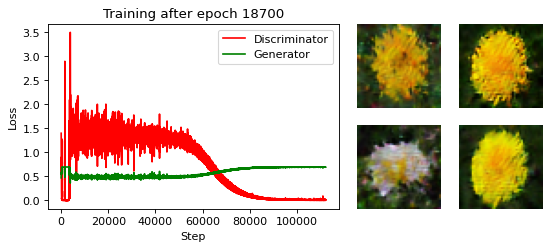

Summary after epoch 18800
Training progress: 94%
Time elapsed: 20266 seconds
Current Discriminator Loss: 0.002
Current Generator Loss: 0.692
Total trained on images: 22560000
Total weight adjustments: 112800


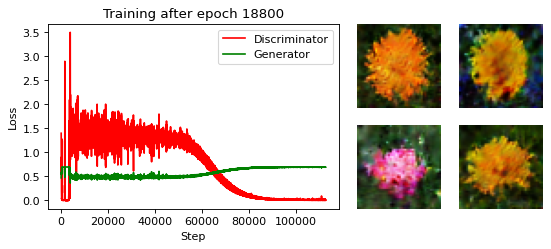

Summary after epoch 18900
Training progress: 94%
Time elapsed: 20374 seconds
Current Discriminator Loss: 0.004
Current Generator Loss: 0.691
Total trained on images: 22680000
Total weight adjustments: 113400


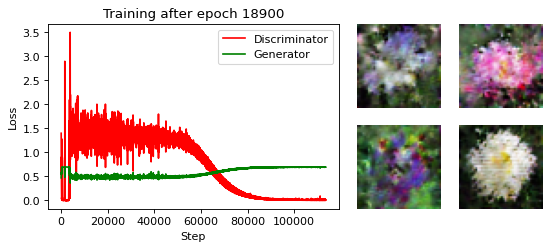

Summary after epoch 19000
Training progress: 95%
Time elapsed: 20480 seconds
Current Discriminator Loss: 0.003
Current Generator Loss: 0.691
Total trained on images: 22800000
Total weight adjustments: 114000


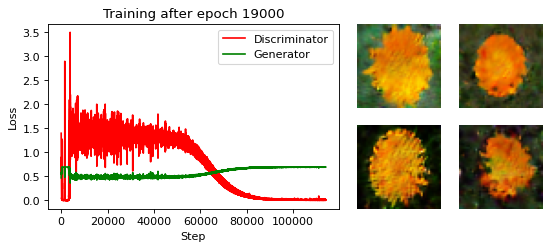

Summary after epoch 19100
Training progress: 96%
Time elapsed: 20588 seconds
Current Discriminator Loss: 0.003
Current Generator Loss: 0.691
Total trained on images: 22920000
Total weight adjustments: 114600


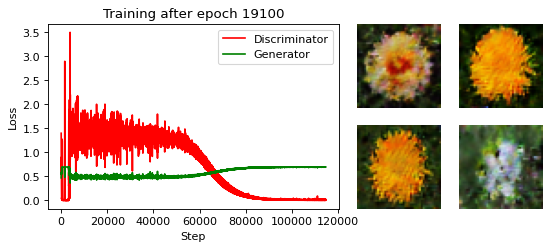

Summary after epoch 19200
Training progress: 96%
Time elapsed: 20696 seconds
Current Discriminator Loss: 0.001
Current Generator Loss: 0.692
Total trained on images: 23040000
Total weight adjustments: 115200


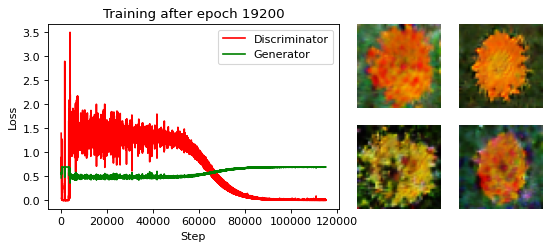

Summary after epoch 19300
Training progress: 96%
Time elapsed: 20803 seconds
Current Discriminator Loss: 0.004
Current Generator Loss: 0.691
Total trained on images: 23160000
Total weight adjustments: 115800


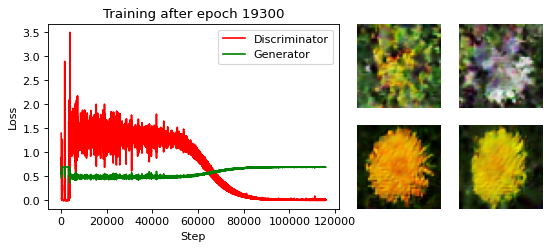

Summary after epoch 19400
Training progress: 97%
Time elapsed: 20911 seconds
Current Discriminator Loss: 0.004
Current Generator Loss: 0.691
Total trained on images: 23280000
Total weight adjustments: 116400


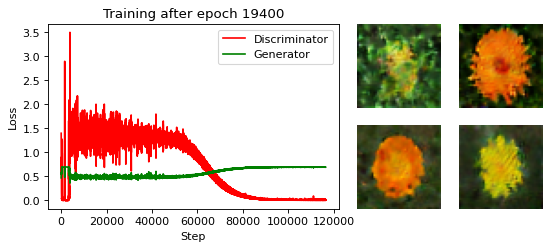

In [ ]:
generator_model = complete_training(generator_learn_rate=0.0001, 
                                    discriminator_learn_rate=0.00001, 
                                    batch_size=200,
                                    pretraining_steps=0, 
                                    training_epochs=20000,
                                    create_new_models=True)

In [ ]:
noise = tf.random.normal([100, 100])
fake_img_batch = generator_model(noise, training=False)

fig, axes = plt.subplots(nrows=10, ncols=10, figsize=(10, 10), dpi=80)
plt.suptitle("Example of generated Images", y=0.91)
for i in range(10):
    for j in range(10):
        axes[i][j].imshow(fake_img_batch[i*10+j], cmap="gray")
        axes[i][j].axis('off')

plt.show()